In [1]:
import pickle
import matplotlib.pyplot as plt
data_path = "/Users/aruna.nyssanbay/Documents/LR1/data.pickle"  # if the file can't be found try absolute path

# The data is stored in .pickle format, so we use pickle module to load it. 
# It takes several seconds to load the file. 
with open(data_path, "rb") as file:
    records = pickle.load(file)
    file.close()

In [2]:
# Print all dyads ids
print(records.keys())


dict_keys(['[100, 101]', '[102, 103]', '[104, 105]', '[200, 201]', '[202, 203]', '[204, 205]', '[206, 207]', '[208, 209]', '[210, 211]', '[300, 301]', '[304, 305]', '[306, 307]', '[308, 309]', '[310, 311]'])


In [3]:
# Print an example of block ids. The keys are integers. 
print(records['[200, 201]'].keys())

dict_keys([1, 2, 3])


In [4]:
# Print the first 5 rows of the table
records['[100, 101]'][1].head()

,timestamp,p0_score,p1_score,p0_agent_x,p0_agent_y,p1_agent_x,p1_agent_y,p0_gaze_x,p0_gaze_y,p1_gaze_x,...,coop0_entered_by_p1,coop1_entered_by_p0,coop1_entered_by_p1,comp_left_by_p0,comp_left_by_p1,coop0_left_by_p0,coop0_left_by_p1,coop1_left_by_p0,coop1_left_by_p1,org_timestamp
0,0.000000,0.0,0.0,0.5,0.5,0.5,0.5,0.000000,0.000000,0.000000,...,0,0,0,0,0,0,0,0,0,3659.639546
1,0.007808,0.0,0.0,0.5,0.5,0.5,0.5,0.468573,0.523261,0.603357,...,0,0,0,0,0,0,0,0,0,3659.647354
2,0.016175,0.0,0.0,0.5,0.5,0.5,0.5,0.467244,0.523696,0.599759,...,0,0,0,0,0,0,0,0,0,3659.655721
3,0.025929,0.0,0.0,0.5,0.5,0.5,0.5,0.466559,0.523555,0.599048,...,0,0,0,0,0,0,0,0,0,3659.665475
4,0.032879,0.0,0.0,0.5,0.5,0.5,0.5,0.467537,0.525252,0.599965,...,0,0,0,0,0,0,0,0,0,3659.672425


In [5]:
# Print all columns in the table
records['[100, 101]'][1].columns

Index(['timestamp', 'p0_score', 'p1_score', 'p0_agent_x', 'p0_agent_y',
       'p1_agent_x', 'p1_agent_y', 'p0_gaze_x', 'p0_gaze_y', 'p1_gaze_x',
       'p1_gaze_y', 'comp_x', 'comp_y', 'coop0_x', 'coop0_y', 'coop1_x',
       'coop1_y', 'comp_collected_by_p0', 'comp_collected_by_p1',
       'coop0_collected', 'coop1_collected', 'comp_entered_by_p0',
       'comp_entered_by_p1', 'coop0_entered_by_p0', 'coop0_entered_by_p1',
       'coop1_entered_by_p0', 'coop1_entered_by_p1', 'comp_left_by_p0',
       'comp_left_by_p1', 'coop0_left_by_p0', 'coop0_left_by_p1',
       'coop1_left_by_p0', 'coop1_left_by_p1', 'org_timestamp'],
      dtype='object')

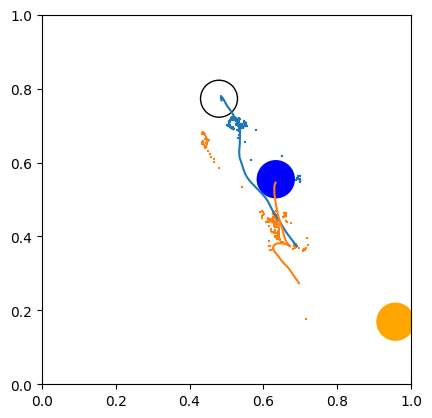

In [6]:
plt.style.use('default')
dyad = '[100, 101]'
block = 1
rec = records[dyad][block]

rec_interval = rec.loc[(rec['timestamp'] >= 15) & (rec['timestamp'] < 17)]  # get the frames in the interval between 15th and 18th second.

fig, ax = plt.subplots()

# Plot agent trajectories
ax.plot(rec_interval['p0_agent_x'], rec_interval['p0_agent_y'])
ax.plot(rec_interval['p1_agent_x'], rec_interval['p1_agent_y'])

# Plot eye-tracking
ax.scatter(rec_interval['p0_gaze_x'], rec_interval['p0_gaze_y'], marker='+', s=1, color='tab:blue')
ax.scatter(rec_interval['p1_gaze_x'], rec_interval['p1_gaze_y'], marker='+', s=1, color='tab:orange')

# Plot targets
comp = plt.Circle(rec_interval[['comp_x', 'comp_y']].iloc[0], radius=0.05, color='black', fill=False)
coop0 = plt.Circle(rec_interval[['coop0_x', 'coop0_y']].iloc[0], radius=0.05, color='blue', fill=True)
coop1 = plt.Circle(rec_interval[['coop1_x', 'coop1_y']].iloc[0], radius=0.05, color='orange', fill=True)

ax.add_artist(comp)
ax.add_artist(coop0)
ax.add_artist(coop1)

ax.set_xlim([0, 1])
ax.set_ylim([0, 1])
ax.set_aspect(1)


In [104]:
import numpy as np
import pandas as pd
#Choose dyad number
game=6
if game==1:
    dyad='[100, 101]'
elif game==2:
    dyad='[102, 103]'
elif game==3:
    dyad='[104, 105]'
elif game==4:
    dyad='[200, 201]'
elif game==5:
    dyad='[202, 203]'
elif game==6:
    dyad='[204, 205]'
elif game==7:
    dyad='[206, 207]'
elif game==8:
    dyad='[208, 209]'
elif game==9:
    dyad='[210, 211]'
elif game==10:
    dyad='[300, 301]'
elif game==11:
    dyad='[304, 305]'
elif game==12:
    dyad='[306, 307]'
elif game==13:
    dyad='[308, 309]'
elif game==14:
    dyad='[310, 311]'
else:
    print('Choose dyad from 1 to 14')

if len(records[dyad].keys())==3:  
    d1_b1=[records[dyad][1], records[dyad][2], records[dyad][3]]
    d1_b1=pd.concat(d1_b1)
    
elif len(records[dyad].keys())==2:
    d1_b1=[records[dyad][1], records[dyad][2]]
    d1_b1=pd.concat(d1_b1)
   
else:
    print('There must be a mistake in your data!')

    
d1_b1_d_h_w_0=((d1_b1['p0_agent_x'] - d1_b1['comp_x'])**2+(d1_b1['p0_agent_y'] - d1_b1['comp_y'])**2)**(1/2)#hand/cursor to targets
d1_b1_d_h_oj_0=((d1_b1['p0_agent_x'] - d1_b1['coop1_x'])**2+(d1_b1['p0_agent_y'] - d1_b1['coop1_y'])**2)**(1/2)
d1_b1_d_h_bj_0=((d1_b1['p0_agent_x'] - d1_b1['coop0_x'])**2+(d1_b1['p0_agent_y'] - d1_b1['coop0_y'])**2)**(1/2)
d1_b1_d_e_w_0=((d1_b1['p0_gaze_x'] - d1_b1['comp_x'])**2+(d1_b1['p0_gaze_y'] - d1_b1['comp_y'])**2)**(1/2)#eye to targets
d1_b1_d_e_oj_0=((d1_b1['p0_gaze_x'] - d1_b1['coop1_x'])**2+(d1_b1['p0_gaze_y'] - d1_b1['coop1_y'])**2)**(1/2)
d1_b1_d_e_bj_0=((d1_b1['p0_gaze_x'] - d1_b1['coop0_x'])**2+(d1_b1['p0_gaze_y'] - d1_b1['coop0_y'])**2)**(1/2)

d1_b1_d_h_w=((d1_b1['p1_agent_x'] - d1_b1['comp_x'])**2+(d1_b1['p1_agent_y'] - d1_b1['comp_y'])**2)**(1/2)#hand/cursor to targets
d1_b1_d_h_oj=((d1_b1['p1_agent_x'] - d1_b1['coop1_x'])**2+(d1_b1['p1_agent_y'] - d1_b1['coop1_y'])**2)**(1/2)
d1_b1_d_h_bj=((d1_b1['p1_agent_x'] - d1_b1['coop0_x'])**2+(d1_b1['p1_agent_y'] - d1_b1['coop0_y'])**2)**(1/2)
d1_b1_d_e_w=((d1_b1['p1_gaze_x'] - d1_b1['comp_x'])**2+(d1_b1['p1_gaze_y'] - d1_b1['comp_y'])**2)**(1/2)#eye to targets
d1_b1_d_e_oj=((d1_b1['p1_gaze_x'] - d1_b1['coop1_x'])**2+(d1_b1['p1_gaze_y'] - d1_b1['coop1_y'])**2)**(1/2)
d1_b1_d_e_bj=((d1_b1['p1_gaze_x'] - d1_b1['coop0_x'])**2+(d1_b1['p1_gaze_y'] - d1_b1['coop0_y'])**2)**(1/2)

d1_b1_d_g0_h0=((d1_b1['p0_agent_x'] - d1_b1['p0_gaze_x'])**2+(d1_b1['p0_agent_y'] - d1_b1['p0_gaze_y'])**2)**(1/2)
d1_b1_d_g0_h1=((d1_b1['p1_agent_x'] - d1_b1['p0_gaze_x'])**2+(d1_b1['p1_agent_y'] - d1_b1['p0_gaze_y'])**2)**(1/2)
d1_b1_d_g1_h0=((d1_b1['p0_agent_x'] - d1_b1['p1_gaze_x'])**2+(d1_b1['p0_agent_y'] - d1_b1['p1_gaze_y'])**2)**(1/2)
d1_b1_d_g1_h1=((d1_b1['p1_agent_x'] - d1_b1['p1_gaze_x'])**2+(d1_b1['p1_agent_y'] - d1_b1['p1_gaze_y'])**2)**(1/2)

sum_c=d1_b1['comp_collected_by_p0']+d1_b1['comp_collected_by_p1'] + d1_b1['coop0_collected']+d1_b1['coop1_collected']



trial_end=list(np.where(sum_c>0)[0])

trials_number=len(trial_end)
print(trials_number)
white_p0=list(np.where(d1_b1['comp_collected_by_p0']>0)[0])
white_p1=list(np.where(d1_b1['comp_collected_by_p1']>0)[0])
blue_joint=list(np.where(d1_b1['coop0_collected']>0)[0])
yellow_joint=list(np.where(d1_b1['coop1_collected']>0)[0])
FST_player1=round(len(white_p0)/(len(white_p0)+len(yellow_joint)+len(blue_joint)),2)
FST_player2=round(len(white_p1)/(len(white_p1)+len(yellow_joint)+len(blue_joint)),2)
print(FST_player1)
print(FST_player2)


1740
0.13
0.22


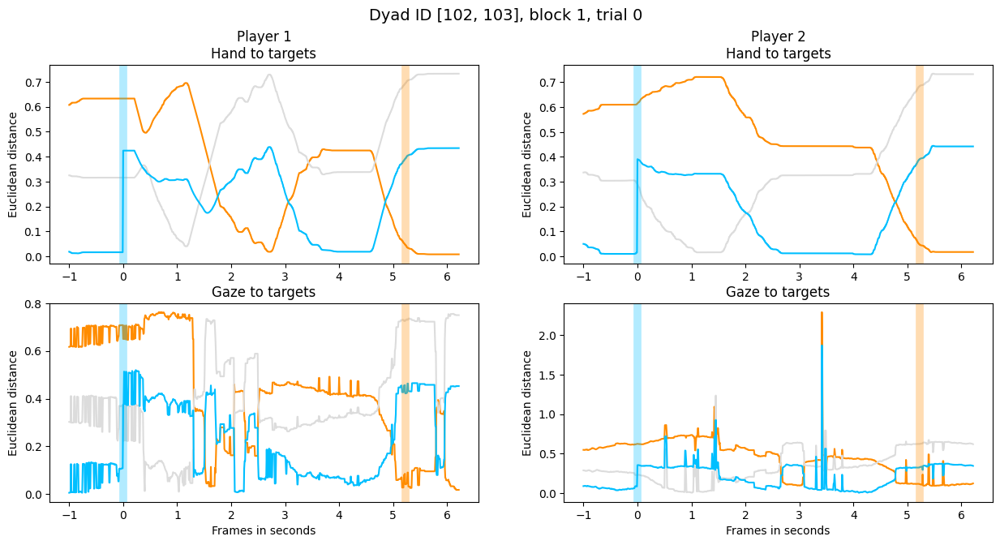

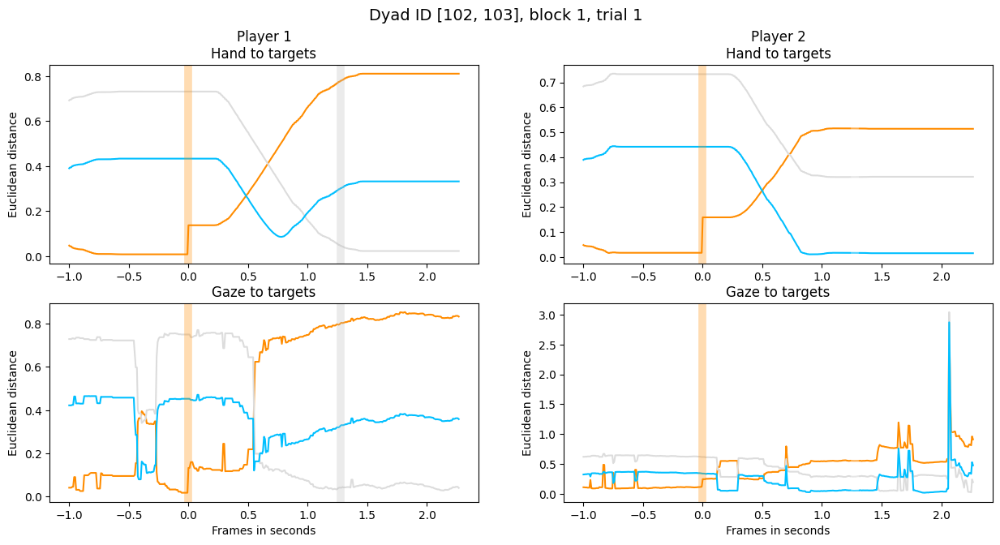

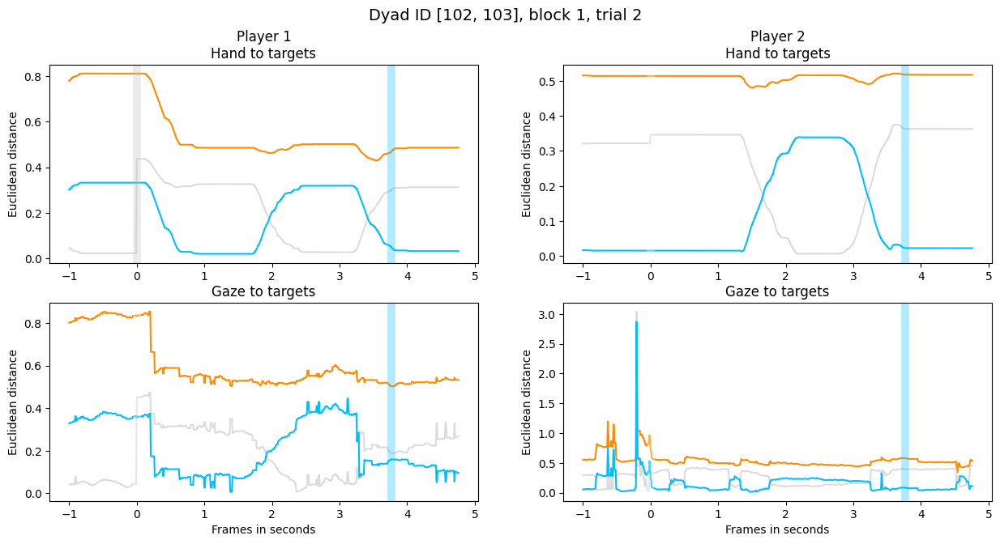

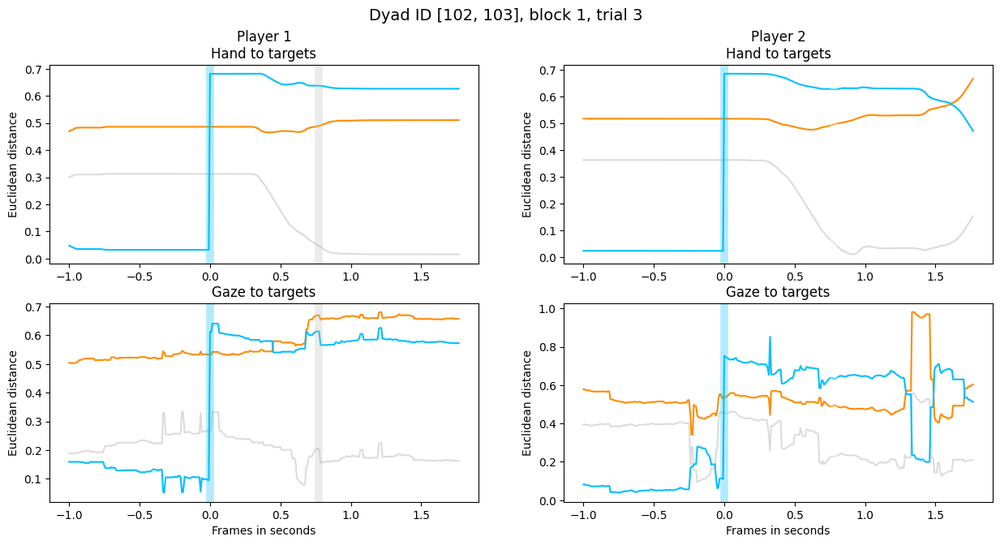

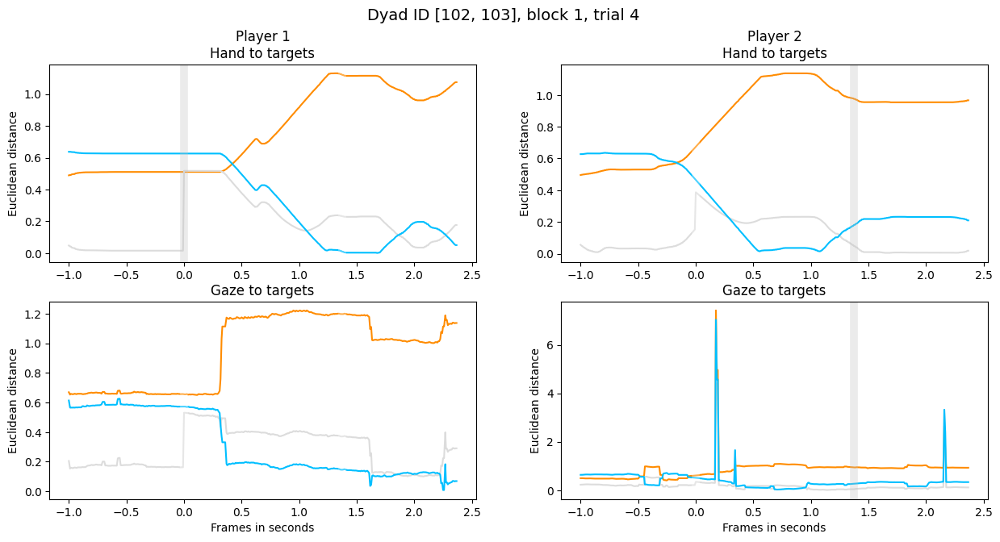

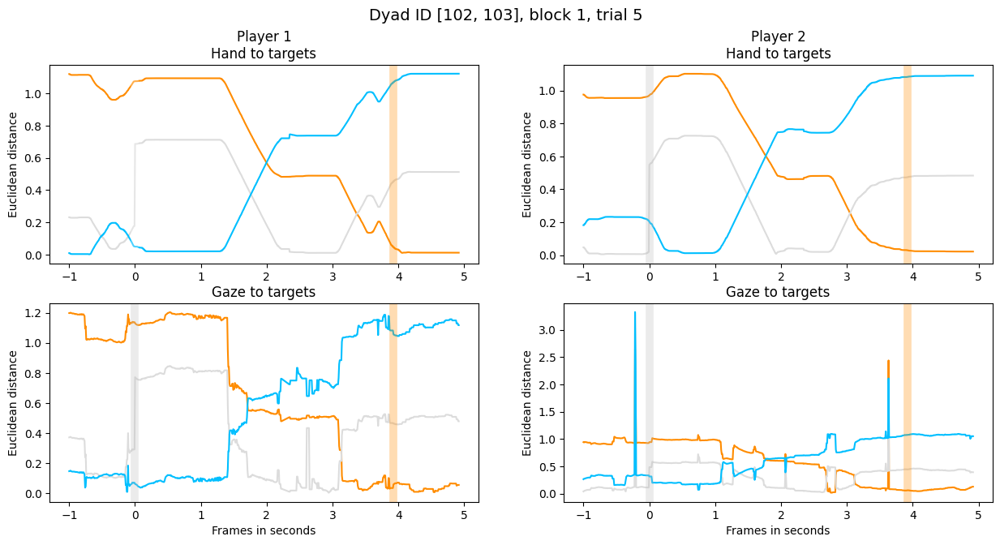

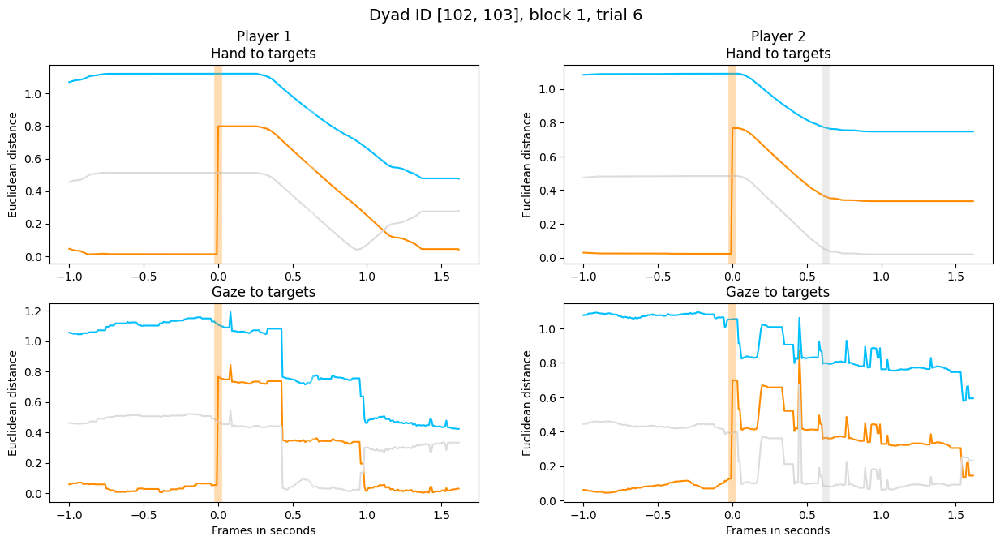

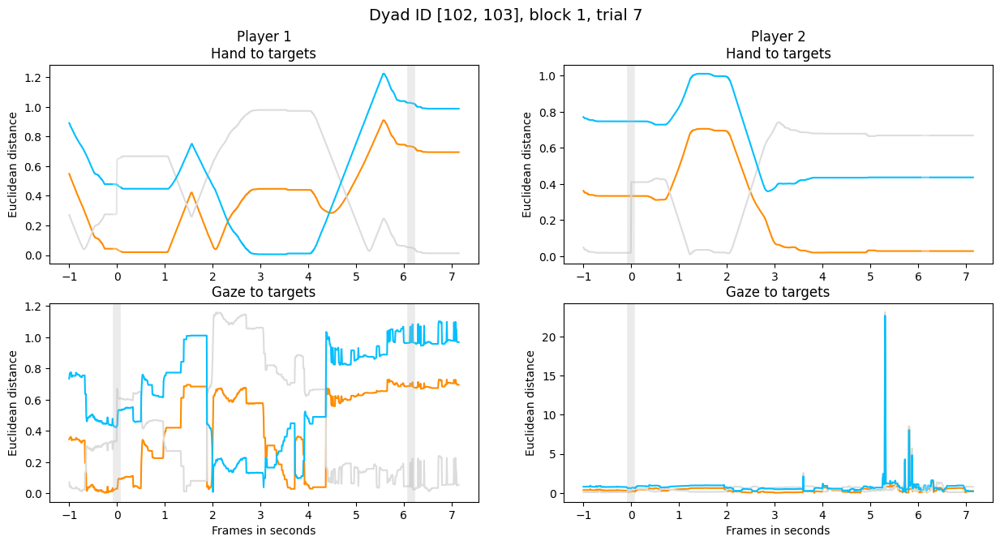

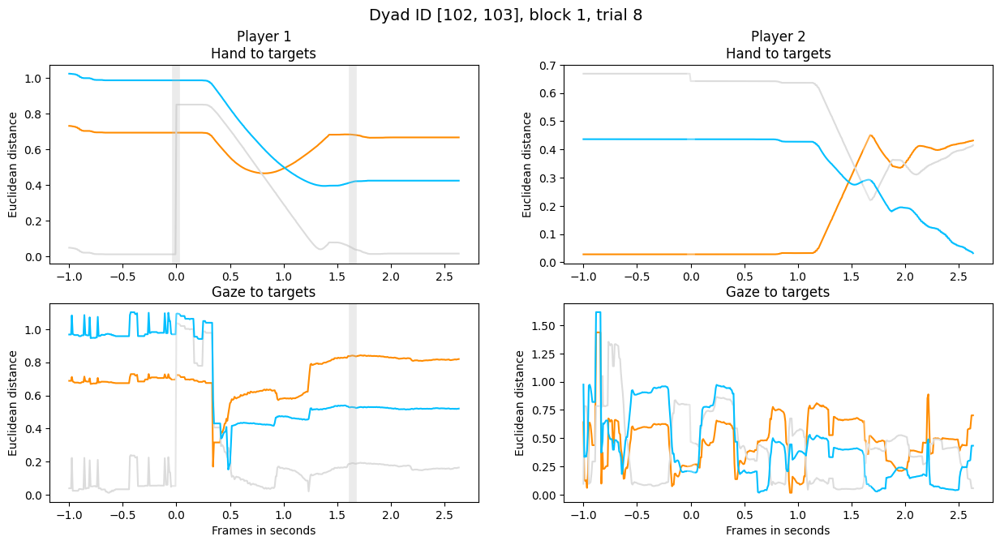

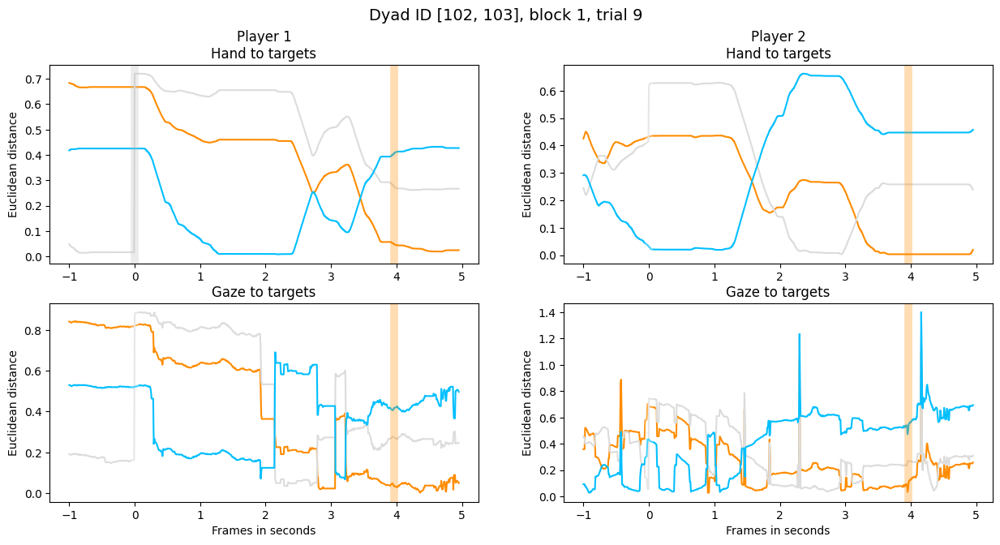

In [8]:
for trial_id in range(10):
    #Vertical lines colors
    if trial_end[trial_id] in yellow_joint:
        color_start_0='darkorange'
    elif trial_end[trial_id] in blue_joint:
        color_start_0='deepskyblue'
    elif trial_end[trial_id] in white_p0:
        color_start_0='silver'
    else:
        color_start_0='white'

    if trial_end[trial_id] in yellow_joint:
        color_start='darkorange'
    elif trial_end[trial_id] in blue_joint:
        color_start='deepskyblue'
    elif trial_end[trial_id] in white_p1:
        color_start='silver'
    else:
        color_start='white'
        
    if trial_end[trial_id+1] in yellow_joint:
        color_end_0='darkorange'
    elif trial_end[trial_id+1] in blue_joint:
        color_end_0='deepskyblue'
    elif trial_end[trial_id+1] in white_p0:
        color_end_0='silver'
    else:
        color_end_0='white'

    if trial_end[trial_id+1] in yellow_joint:
        color_end='darkorange'
    elif trial_end[trial_id+1] in blue_joint:
        color_end='deepskyblue'
    elif trial_end[trial_id+1] in white_p1:
        color_end='silver'
    else:
        color_end='white'
        
    plt.figure(figsize=(15, 7))
    plt.subplot(2,2,1) #plt 1-hand player 1/
    plt.title(f'Player 1\nHand to targets')
    plt.ylabel('Euclidean distance')
    frames=records[dyad][block]['timestamp']
    offset = 120
    plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id+1]] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_h_oj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id+1]],'-',c='darkorange')
    plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id+1]] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_h_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id+1]],'-',c='gainsboro')
    plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id+1]] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_h_bj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id+1]],'-',c='deepskyblue')
    plt.axvline(x=0,c=color_start_0, alpha=0.3,linewidth=7.0)
    plt.axvline(x=frames[trial_end[trial_id+1]] - frames[trial_end[trial_id]-offset] - 2,c=color_end_0, alpha=0.3,linewidth=7.0)

    plt.subplot(2,2,2) #plt 2-hand player 2
    plt.title(f'Player 2\nHand to targets')
    plt.ylabel('Euclidean distance')
    frames=records[dyad][block]['timestamp']
    offset = 120
    plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id+1]] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_h_oj.iloc[trial_end[trial_id]-offset:trial_end[trial_id+1]],'-',c='darkorange')
    plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id+1]] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_h_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id+1]],'-',c='gainsboro')
    plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id+1]] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_h_bj.iloc[trial_end[trial_id]-offset:trial_end[trial_id+1]],'-',c='deepskyblue')
    plt.axvline(x=0,c=color_start, alpha=0.3,linewidth=7.0)
    plt.axvline(x=frames[trial_end[trial_id+1]] - frames[trial_end[trial_id]-offset] - 2,c=color_end, alpha=0.3,linewidth=7.0)

    plt.subplot(2,2,3) #plt 3-eye player 1
    plt.title(f'Gaze to targets')
    plt.ylabel('Euclidean distance')
    plt.xlabel('Frames in seconds')
    plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id+1]] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_e_oj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id+1]],'-',c='darkorange')
    plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id+1]] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_e_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id+1]],'-',c='gainsboro')
    plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id+1]] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_e_bj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id+1]],'-',c='deepskyblue')
    plt.axvline(x=0,c=color_start,alpha=0.3,linewidth=7.0)
    plt.axvline(x=frames[trial_end[trial_id+1]] - frames[trial_end[trial_id]-offset] - 2,c=color_end_0,alpha=0.3,linewidth=7.0)

    plt.subplot(2,2,4) #plt 4-eye player 2
    plt.title(f'Gaze to targets')
    plt.ylabel('Euclidean distance')
    plt.xlabel('Frames in seconds')
    plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id+1]] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_e_oj.iloc[trial_end[trial_id]-offset:trial_end[trial_id+1]],'-',c='darkorange')
    plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id+1]] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_e_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id+1]],'-',c='gainsboro')
    plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id+1]] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_e_bj.iloc[trial_end[trial_id]-offset:trial_end[trial_id+1]],'-',c='deepskyblue')
    plt.axvline(x=0,c=color_start,alpha=0.3,linewidth=7.0)
    plt.axvline(x=frames[trial_end[trial_id+1]] - frames[trial_end[trial_id]-offset] - 2,c=color_end,alpha=0.3,linewidth=7.0)

    plt.suptitle(f'Dyad ID {dyad}, block {block}, trial {trial_id}', fontsize=14)


/Users/aruna.nyssanbay/anaconda3/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)


IndexError: list index out of range

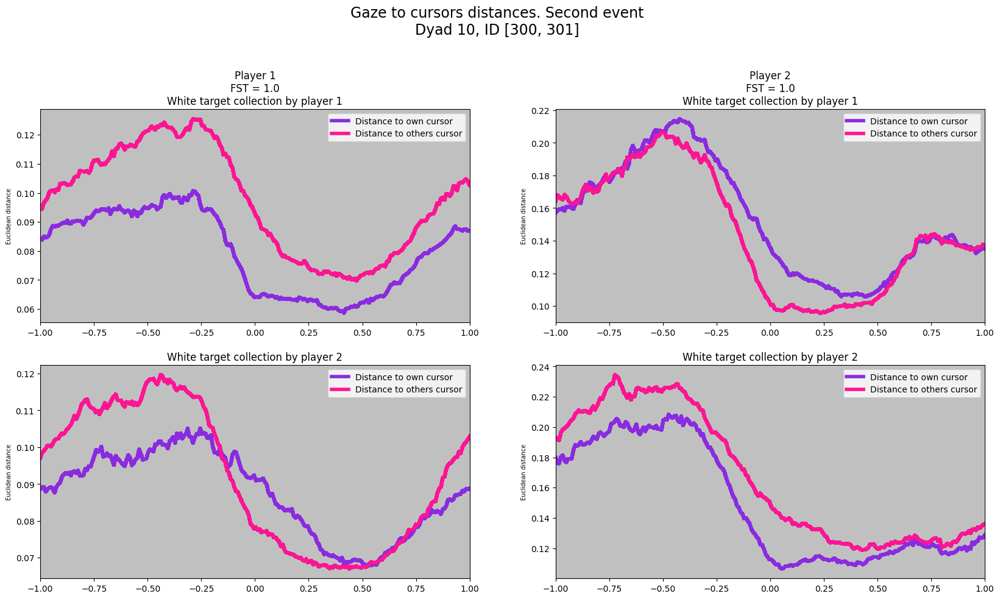

In [60]:
#This code creates plots for gaze to cursors distances 
mean_g0_h0 = []
for id in blue_joint:
    if d1_b1_d_g0_h0.iloc[id-2*offset:id].max()<2**(1/2):
        mean_g0_h0.append(d1_b1_d_g0_h0.iloc[id-2*offset:id])
g0_h0 = np.array(mean_g0_h0)
#mean_h_bj_0 = np.nanmean(h_bj_0, axis=0)
median_g0_h0 = np.nanmedian(g0_h0, axis=0)

mean_g0_h1 = []
for id in blue_joint:
    if d1_b1_d_g0_h1.iloc[id-2*offset:id].max()<2**(1/2):
        mean_g0_h1.append(d1_b1_d_g0_h1.iloc[id-2*offset:id])
g0_h1 = np.array(mean_g0_h1)
median_g0_h1 = np.nanmedian(g0_h1, axis=0)

mean_g1_h0 = []
for id in blue_joint:
    if d1_b1_d_g1_h0.iloc[id-2*offset:id].max()<2**(1/2):
        mean_g1_h0.append(d1_b1_d_g1_h0.iloc[id-2*offset:id])
g1_h0 = np.array(mean_g1_h0)
median_g1_h0 = np.nanmedian(g1_h0, axis=0)

mean_g1_h1 = []
for id in blue_joint:
    if d1_b1_d_g1_h1.iloc[id-2*offset:id].max()<2**(1/2):
        mean_g1_h1.append(d1_b1_d_g1_h1.iloc[id-2*offset:id])
g1_h1 = np.array(mean_g1_h1)
median_g1_h1 = np.nanmedian(g1_h1, axis=0)


mean_g0_h0_y = []
for id in yellow_joint:
    if d1_b1_d_g0_h0.iloc[id-2*offset:id].max()<2**(1/2):
        mean_g0_h0_y.append(d1_b1_d_g0_h0.iloc[id-2*offset:id])
g0_h0_y = np.array(mean_g0_h0_y)
#mean_h_bj_0 = np.nanmean(h_bj_0, axis=0)
median_g0_h0_y = np.nanmedian(g0_h0_y, axis=0)

mean_g0_h1_y = []
for id in yellow_joint:
    if d1_b1_d_g0_h1.iloc[id-2*offset:id].max()<2**(1/2):
        mean_g0_h1_y.append(d1_b1_d_g0_h1.iloc[id-2*offset:id])
g0_h1_y = np.array(mean_g0_h1_y)
median_g0_h1_y = np.nanmedian(g0_h1_y, axis=0)

mean_g1_h0_y = []
for id in yellow_joint:
    if d1_b1_d_g1_h0.iloc[id-2*offset:id].max()<2**(1/2):
        mean_g1_h0_y.append(d1_b1_d_g1_h0.iloc[id-2*offset:id])
g1_h0_y = np.array(mean_g1_h0_y)
median_g1_h0_y = np.nanmedian(g1_h0_y, axis=0)

mean_g1_h1_y = []
for id in yellow_joint:
    if d1_b1_d_g1_h1.iloc[id-2*offset:id].max()<2**(1/2):
        mean_g1_h1_y.append(d1_b1_d_g1_h1.iloc[id-2*offset:id])
g1_h1_y = np.array(mean_g1_h1_y)
median_g1_h1_y = np.nanmedian(g1_h1_y, axis=0)


mean_g0_h0_w0 = []
for id in white_p0:
    if d1_b1_d_g0_h0.iloc[id-2*offset:id].max()<2**(1/2):
        mean_g0_h0_w0.append(d1_b1_d_g0_h0.iloc[id-2*offset:id])
g0_h0_w0 = np.array(mean_g0_h0_w0)
#mean_h_bj_0 = np.nanmean(h_bj_0, axis=0)
median_g0_h0_w0 = np.nanmedian(g0_h0_w0, axis=0)

mean_g0_h1_w0 = []
for id in white_p0:
    if d1_b1_d_g0_h1.iloc[id-2*offset:id].max()<2**(1/2):
        mean_g0_h1_w0.append(d1_b1_d_g0_h1.iloc[id-2*offset:id])
g0_h1_w0 = np.array(mean_g0_h1_w0)
median_g0_h1_w0 = np.nanmedian(g0_h1_w0, axis=0)

mean_g1_h0_w0 = []
for id in white_p0:
    if d1_b1_d_g1_h0.iloc[id-2*offset:id].max()<2**(1/2):
        mean_g1_h0_w0.append(d1_b1_d_g1_h0.iloc[id-2*offset:id])
g1_h0_w0 = np.array(mean_g1_h0_w0)
median_g1_h0_w0 = np.nanmedian(g1_h0_w0, axis=0)

mean_g1_h1_w0 = []
for id in white_p0:
    if d1_b1_d_g1_h1.iloc[id-2*offset:id].max()<2**(1/2):
        mean_g1_h1_w0.append(d1_b1_d_g1_h1.iloc[id-2*offset:id])
g1_h1_w0 = np.array(mean_g1_h1_w0)
median_g1_h1_w0 = np.nanmedian(g1_h1_w0, axis=0)


mean_g0_h0_w1 = []
for id in white_p1:
    if d1_b1_d_g0_h0.iloc[id-2*offset:id].max()<2**(1/2):
        mean_g0_h0_w1.append(d1_b1_d_g0_h0.iloc[id-2*offset:id])
g0_h0_w1 = np.array(mean_g0_h0_w1)
#mean_h_bj_0 = np.nanmean(h_bj_0, axis=0)
median_g0_h0_w1 = np.nanmedian(g0_h0_w1, axis=0)

mean_g0_h1_w1 = []
for id in white_p1:
    if d1_b1_d_g0_h1.iloc[id-2*offset:id].max()<2**(1/2):
        mean_g0_h1_w1.append(d1_b1_d_g0_h1.iloc[id-2*offset:id])
g0_h1_w1 = np.array(mean_g0_h1_w1)
median_g0_h1_w1 = np.nanmedian(g0_h1_w1, axis=0)

mean_g1_h0_w1 = []
for id in white_p1:
    if d1_b1_d_g1_h0.iloc[id-2*offset:id].max()<2**(1/2):
        mean_g1_h0_w1.append(d1_b1_d_g1_h0.iloc[id-2*offset:id])
g1_h0_w1 = np.array(mean_g1_h0_w1)
median_g1_h0_w1 = np.nanmedian(g1_h0_w1, axis=0)

mean_g1_h1_w1 = []
for id in white_p1:
    if d1_b1_d_g1_h1.iloc[id-2*offset:id].max()<2**(1/2):
        mean_g1_h1_w1.append(d1_b1_d_g1_h1.iloc[id-2*offset:id])
g1_h1_w1 = np.array(mean_g1_h1_w1)
median_g1_h1_w1 = np.nanmedian(g1_h1_w1, axis=0)

if game==10 or game==14: 
    plt.figure(figsize=(20, 10))
    plt.suptitle(f'Gaze to cursors distances. Second event\nDyad {game}, ID {dyad}',y=1.05,fontsize=17)
    for trial_id in range(trials_number):
        if trial_end[trial_id+1] in white_p0:
        #w_p0_h_p0
            plt.subplot(2,2,1,facecolor='silver',alpha=0.3)

            plt.plot(np.linspace(-1, 1, 2*offset), median_g0_h0_w0,c='blueviolet',linewidth=4.0)
            plt.plot(np.linspace(-1, 1, 2*offset), median_g0_h1_w0,c='deeppink',linewidth=4.0)

            plt.xlim(-1,1)
            #plt.title(f'Hand to targets')
            plt.ylabel('Euclidean distance',fontsize=7)
            plt.legend(['Distance to own cursor','Distance to others cursor'])
            plt.title(f'Player 1\nFST = {FST_player1}\nWhite target collection by player 1')
         #w_p0_h_p1   
            plt.subplot(2,2,2,facecolor='silver',alpha=0.3)
            plt.plot(np.linspace(-1, 1, 2*offset), median_g1_h1_w0,c='blueviolet',linewidth=4.0) 
            plt.plot(np.linspace(-1, 1, 2*offset), median_g1_h0_w0,c='deeppink',linewidth=4.0)

            plt.legend(['Distance to own cursor','Distance to others cursor'])
            plt.xlim(-1,1)
            #plt.title(f'Hand to targets')
            plt.ylabel('Euclidean distance',fontsize=7)
            plt.title(f'Player 2\nFST = {FST_player2}\nWhite target collection by player 1')
        #w_p0_e_p0


        elif trial_end[trial_id+1] in white_p1:
        #w_p1_h_p0 
            plt.subplot(2,2,3,facecolor='silver',alpha=0.3)
            plt.plot(np.linspace(-1, 1, 2*offset), median_g0_h0_w1,c='blueviolet',linewidth=4.0)
            plt.plot(np.linspace(-1, 1, 2*offset), median_g0_h1_w1,c='deeppink',linewidth=4.0)
            plt.legend(['Distance to own cursor','Distance to others cursor'])
            #plt.title(f'Hand to targets')
            plt.ylabel('Euclidean distance',fontsize=7)


            plt.xlim(-1,1)    
            plt.title(f'White target collection by player 2')
        #w_p1_h_p1  
            plt.subplot(2,2,4,facecolor='silver',alpha=0.3)

            plt.plot(np.linspace(-1, 1, 2*offset), median_g1_h1_w1,c='blueviolet',linewidth=4.0) 
            plt.plot(np.linspace(-1, 1, 2*offset), median_g1_h0_w1,c='deeppink',linewidth=4.0)
            plt.legend(['Distance to own cursor','Distance to others cursor'])
            plt.xlim(-1,1)
            #plt.title(f'Hand to targets')
            plt.ylabel('Euclidean distance',fontsize=7)
            #plt.savefig (f'/Users/aruna.nyssanbay/Documents/LR1/Figures/Dyad {dyad}, ID {dyad}. 2nd event. Gaze to cursors.png')   
            plt.title(f'White target collection by player 2')
        
else:        
    plt.figure(figsize=(20, 20))
    plt.suptitle(f'Gaze to cursors distances. Second event\nDyad {game}, ID {dyad}',y=0.95,fontsize=17)

    for trial_id in range(trials_number):
        if trial_end[trial_id+1] in blue_joint:

         #h_bj_0

            plt.subplot(4,2,1,facecolor='deepskyblue',alpha=0.3)


            plt.plot(np.linspace(-1, 1, 2*offset), median_g0_h0,c='blueviolet',linewidth=4.0)
            plt.plot(np.linspace(-1, 1, 2*offset), median_g0_h1,c='deeppink',linewidth=4.0)

           # plt.fill_between(np.linspace(-1, 1, 2*offset), 0, d1_b1_d_g0_h0.iloc[id-2*offset:id].max(), color='blue', alpha=0.2)
           # plt.plot(np.linspace(-1, 1, 2*offset), median_h_bj_0,c='deeppink',linewidth=4.0,alpha=0.5)
            #plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_g0_h0.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='deepskyblue',alpha=0.1)
            #plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_g0_h1.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='deepskyblue',alpha=0.1)
            plt.xlim(-1,1)
            plt.title(f'Player 1\nFST = {FST_player1}\nBlue target collection')
            plt.ylabel('Euclidean distance',fontsize=7)
            plt.legend(['Distance to own cursor','Distance to others cursor'])
            #plt.legend(['Mean','Median'])

         #h_bj
            plt.subplot(4,2,2,facecolor='deepskyblue',alpha=0.3)

            #plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_g1_h0.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='deepskyblue',alpha=0.1)
            #plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_g1_h1.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='deepskyblue',alpha=0.1)

            plt.plot(np.linspace(-1, 1, 2*offset), median_g1_h1,c='blueviolet',linewidth=4.0)
            plt.plot(np.linspace(-1, 1, 2*offset), median_g1_h0,c='deeppink',linewidth=4.0)
            plt.legend(['Distance to own cursor','Distance to others cursor'])
            plt.xlim(-1,1)
            plt.title(f'Player 2\nFST = {FST_player2}\nBlue target collection')
            plt.ylabel('Euclidean distance',fontsize=7)

        elif trial_end[trial_id+1] in yellow_joint:
        #h_oj_0
            plt.subplot(4,2,3,facecolor='orange',alpha=0.3)

            plt.plot(np.linspace(-1, 1, 2*offset), median_g0_h0_y,c='blueviolet',linewidth=4.0)
            plt.plot(np.linspace(-1, 1, 2*offset), median_g0_h1_y,c='deeppink',linewidth=4.0)

           # plt.plot(np.linspace(-1, 1, 2*offset), median_h_oj_0,c='deeppink',linewidth=4.0,alpha=0.5)
            #plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_h_oj_0.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='darkorange',alpha=0.1)
            plt.xlim(-1,1)
            #plt.title(f'Hand to targets')
            plt.ylabel('Euclidean distance',fontsize=7)
            plt.legend(['Distance to own cursor','Distance to others cursor'])
            plt.title(f'Yellow target collection')
        #h_oj_0  
            plt.subplot(4,2,4,facecolor='orange',alpha=0.3)

            #plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_h_oj.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='darkorange',alpha=0.1)
            plt.plot(np.linspace(-1, 1, 2*offset), median_g1_h1_y,c='blueviolet',linewidth=4.0)
            plt.plot(np.linspace(-1, 1, 2*offset), median_g1_h0_y,c='deeppink',linewidth=4.0)
            plt.legend(['Distance to own cursor','Distance to others cursor'])
          #  plt.plot(np.linspace(-1, 1, 2*offset), median_h_oj,c='deeppink',linewidth=4.0,alpha=0.5)
            plt.xlim(-1,1)
            #plt.title(f'Hand to targets')
            plt.ylabel('Euclidean distance',fontsize=7)
            plt.title(f'Yellow target collection')

        elif trial_end[trial_id+1] in white_p0:
        #w_p0_h_p0
            plt.subplot(4,2,5,facecolor='silver',alpha=0.3)

            plt.plot(np.linspace(-1, 1, 2*offset), median_g0_h0_w0,c='blueviolet',linewidth=4.0)
            plt.plot(np.linspace(-1, 1, 2*offset), median_g0_h1_w0,c='deeppink',linewidth=4.0)

            plt.xlim(-1,1)
            #plt.title(f'Hand to targets')
            plt.ylabel('Euclidean distance',fontsize=7)
            plt.legend(['Distance to own cursor','Distance to others cursor'])
            plt.title(f'White target collection by player 1')
         #w_p0_h_p1   
            plt.subplot(4,2,6,facecolor='silver',alpha=0.3)
            plt.plot(np.linspace(-1, 1, 2*offset), median_g1_h1_w0,c='blueviolet',linewidth=4.0) 
            plt.plot(np.linspace(-1, 1, 2*offset), median_g1_h0_w0,c='deeppink',linewidth=4.0)

            plt.legend(['Distance to own cursor','Distance to others cursor'])
            plt.xlim(-1,1)
            #plt.title(f'Hand to targets')
            plt.ylabel('Euclidean distance',fontsize=7)
            plt.title(f'White target collection by player 1')
        #w_p0_e_p0


        elif trial_end[trial_id+1] in white_p1:
        #w_p1_h_p0 
            plt.subplot(4,2,7,facecolor='silver',alpha=0.3)
            plt.plot(np.linspace(-1, 1, 2*offset), median_g0_h0_w1,c='blueviolet',linewidth=4.0)
            plt.plot(np.linspace(-1, 1, 2*offset), median_g0_h1_w1,c='deeppink',linewidth=4.0)
            plt.legend(['Distance to own cursor','Distance to others cursor'])
            #plt.title(f'Hand to targets')
            plt.ylabel('Euclidean distance',fontsize=7)


            plt.xlim(-1,1)    
            plt.title(f'White target collection by player 2')
        #w_p1_h_p1  
            plt.subplot(4,2,8,facecolor='silver',alpha=0.3)

            plt.plot(np.linspace(-1, 1, 2*offset), median_g1_h1_w1,c='blueviolet',linewidth=4.0) 
            plt.plot(np.linspace(-1, 1, 2*offset), median_g1_h0_w1,c='deeppink',linewidth=4.0)
            plt.legend(['Distance to own cursor','Distance to others cursor'])
            plt.xlim(-1,1)
            #plt.title(f'Hand to targets')
            plt.ylabel('Euclidean distance',fontsize=7)
            #plt.savefig (f'/Users/aruna.nyssanbay/Documents/LR1/Figures/Dyad {dyad}, ID {dyad}. 2nd event. Gaze to cursors.png')   
            plt.title(f'White target collection by player 2')
        #w_p1_e_p0


    


KeyError: 144096

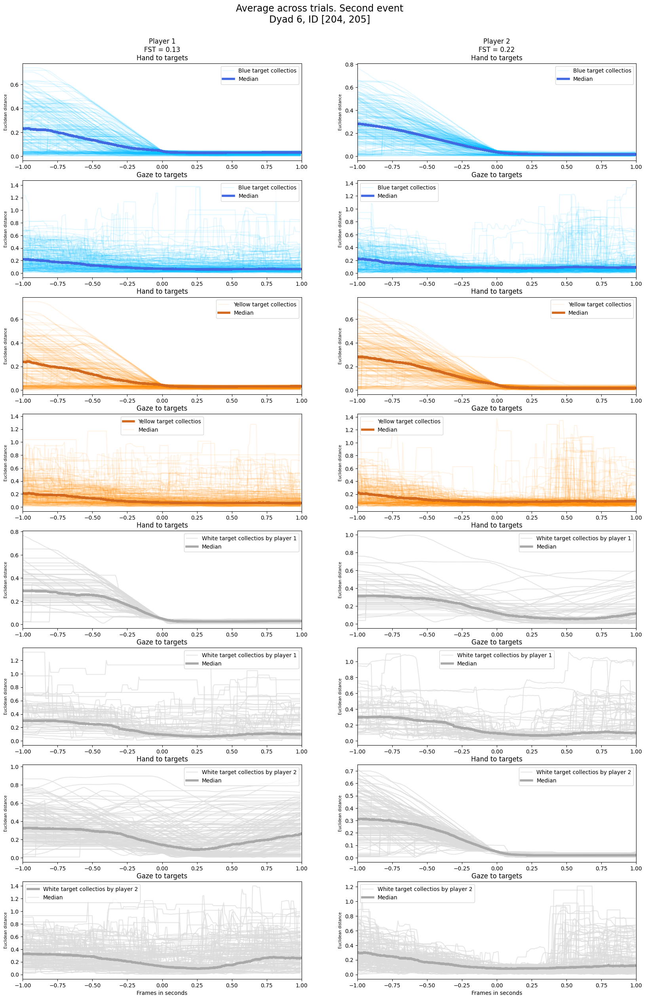

In [105]:
#The code below draws averages
mean_h_bj_0 = []
for id in blue_joint:
    if d1_b1_d_h_bj_0.iloc[id-2*offset:id].max()<2**(1/2):
        mean_h_bj_0.append(d1_b1_d_h_bj_0.iloc[id-2*offset:id])
h_bj_0 = np.array(mean_h_bj_0)
mean_h_bj_0 = np.nanmean(h_bj_0, axis=0)
median_h_bj_0 = np.nanmedian(h_bj_0, axis=0)


mean_h_bj = []
for id in blue_joint:
    if d1_b1_d_h_bj.iloc[id-2*offset:id].max()<2**(1/2):
        mean_h_bj.append(d1_b1_d_h_bj.iloc[id-2*offset:id])
h_bj = np.array(mean_h_bj)
mean_h_bj = np.nanmean(h_bj, axis=0)
median_h_bj = np.nanmedian(h_bj, axis=0)

mean_e_bj_0 = []
for id in blue_joint:
    if d1_b1_d_e_bj_0.iloc[id-2*offset:id].max()<2**(1/2):
        mean_e_bj_0.append(d1_b1_d_e_bj_0.iloc[id-2*offset:id])
e_bj_0 = np.array(mean_e_bj_0)
mean_e_bj_0 = np.nanmean(e_bj_0, axis=0)
median_e_bj_0 = np.nanmedian(e_bj_0, axis=0)

mean_e_bj = []
for id in blue_joint:
     if d1_b1_d_e_bj.iloc[id-2*offset:id].max()<2**(1/2):
         mean_e_bj.append(d1_b1_d_e_bj.iloc[id-2*offset:id])
e_bj = np.array(mean_e_bj)
mean_e_bj = np.nanmean(e_bj, axis=0)
median_e_bj = np.nanmedian(e_bj, axis=0)

mean_h_oj_0 = []
for id in yellow_joint:
    if d1_b1_d_h_oj_0.iloc[id-2*offset:id].max()<2**(1/2):
        mean_h_oj_0.append(d1_b1_d_h_oj_0.iloc[id-2*offset:id])
h_oj_0 = np.array(mean_h_oj_0)
mean_h_oj_0 = np.nanmean(h_oj_0, axis=0)
median_h_oj_0 = np.nanmedian(h_oj_0, axis=0)


mean_h_oj = []
for id in yellow_joint:
    if d1_b1_d_h_oj.iloc[id-2*offset:id].max()<2**(1/2):
        mean_h_oj.append(d1_b1_d_h_oj.iloc[id-2*offset:id])
h_oj = np.array(mean_h_oj)
mean_h_oj = np.nanmean(h_oj, axis=0)
median_h_oj = np.nanmedian(h_oj, axis=0)

mean_e_oj_0 = []
for id in yellow_joint:
    if d1_b1_d_e_oj_0.iloc[id-2*offset:id].max()<2**(1/2):
        mean_e_oj_0.append(d1_b1_d_e_oj_0.iloc[id-2*offset:id])
e_oj_0 = np.array(mean_e_oj_0)
mean_e_oj_0 = np.nanmean(e_oj_0, axis=0)
median_e_oj_0 = np.nanmedian(e_oj_0, axis=0)

mean_e_oj = []
for id in yellow_joint:
    if d1_b1_d_e_oj.iloc[id-2*offset:id].max()<2**(1/2):
        mean_e_oj.append(d1_b1_d_e_oj.iloc[id-2*offset:id])
e_oj = np.array(mean_e_oj)
mean_e_oj = np.nanmean(e_oj, axis=0)
median_e_oj = np.nanmedian(e_oj, axis=0)

mean_h_w_0 = []
for id in white_p0:
    if d1_b1_d_h_w_0.iloc[id-2*offset:id].max()<2**(1/2):
        mean_h_w_0.append(d1_b1_d_h_w_0.iloc[id-2*offset:id])
h_w_0 = np.array(mean_h_w_0)
mean_h_w_0 = np.nanmean(h_w_0, axis=0)
median_h_w_0 = np.nanmedian(h_w_0, axis=0)

mean_h_w = []
for id in white_p0:
    if d1_b1_d_h_w.iloc[id-2*offset:id].max()<2**(1/2):
        mean_h_w.append(d1_b1_d_h_w.iloc[id-2*offset:id])
h_w = np.array(mean_h_w)
mean_h_w = np.nanmean(h_w, axis=0)
median_h_w = np.nanmedian(h_w, axis=0)

mean_e_w_0 = []
for id in white_p0:
    if d1_b1_d_e_w_0.iloc[id-2*offset:id].max()<2**(1/2):
        mean_e_w_0.append(d1_b1_d_e_w_0.iloc[id-2*offset:id])
e_w_0 = np.array(mean_e_w_0)
mean_e_w_0 = np.nanmean(e_w_0, axis=0)
median_e_w_0 = np.nanmedian(e_w_0, axis=0)


mean_e_w = []
for id in white_p0:
    if d1_b1_d_e_w.iloc[id-2*offset:id].max()<2**(1/2):
        mean_e_w.append(d1_b1_d_e_w.iloc[id-2*offset:id])
e_w = np.array(mean_e_w)
mean_e_w = np.nanmean(e_w, axis=0)
median_w=np.nanmedian(e_w, axis=0)
##############
#
mean_h_w_0_p1 = []
for id in white_p1:
    if d1_b1_d_h_w_0.iloc[id-2*offset:id].max()<2**(1/2):
        mean_h_w_0_p1.append(d1_b1_d_h_w_0.iloc[id-2*offset:id])
h_w_0_p1 = np.array(mean_h_w_0_p1)
mean_h_w_0_p1 = np.nanmean(h_w_0_p1, axis=0)
median_h_w_0_p1 = np.nanmedian(h_w_0_p1, axis=0)


mean_h_w_p1 = []
for id in white_p1:
    if d1_b1_d_h_w.iloc[id-2*offset:id].max()<2**(1/2):
        mean_h_w_p1.append(d1_b1_d_h_w.iloc[id-2*offset:id])
h_w_p1 = np.array(mean_h_w_p1)
mean_h_w_p1= np.nanmean(h_w_p1, axis=0)
median_h_w_p1= np.nanmedian(h_w_p1, axis=0)


mean_e_w_0_p1= []
for id in white_p1:
    if d1_b1_d_e_w_0.iloc[id-2*offset:id].max()<2**(1/2):
        mean_e_w_0_p1.append(d1_b1_d_e_w_0.iloc[id-2*offset:id])
e_w_0_p1 = np.array(mean_e_w_0_p1)
mean_e_w_0_p1 = np.nanmean(e_w_0_p1, axis=0)
median_e_w_0_p1 = np.nanmedian(e_w_0_p1, axis=0)

mean_e_w_p1 = []
for id in white_p1:
    if d1_b1_d_e_w.iloc[id-2*offset:id].max()<2**(1/2):
        mean_e_w_p1.append(d1_b1_d_e_w.iloc[id-2*offset:id])
e_w_p1 = np.array(mean_e_w_p1)
mean_e_w_p1 = np.nanmean(e_w_p1, axis=0)
median_e_w_p1 = np.nanmedian(e_w_p1, axis=0)

plt.figure(figsize=(20, 30))
plt.suptitle(f'Average across trials. Second event\nDyad {game}, ID {dyad}',y=0.93,fontsize=17)
i=0
m=0
for trial_id in range(trials_number):
    if trial_end[trial_id+1] in blue_joint:
        i=i+1
     #h_bj_0
    
        plt.subplot(8,2,1)
        #plt.plot(np.linspace(-1, 1, 2*offset), mean_h_bj_0,c='royalblue',linewidth=4.0)
        plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_h_bj_0.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='deepskyblue',alpha=0.1)
        plt.plot(np.linspace(-1, 1, 2*offset), median_h_bj_0,c='royalblue',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Player 1\nFST = {FST_player1}\nHand to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        #plt.legend(['Mean','Median'])
        plt.legend(['Blue target collectios','Median'])

     #h_bj
        plt.subplot(8,2,2)
        plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_h_bj.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='deepskyblue',alpha=0.1)
        plt.plot(np.linspace(-1, 1, 2*offset), mean_h_bj,c='royalblue',linewidth=4.0)
        #plt.plot(np.linspace(-1, 1, 2*offset), median_h_bj,c='deeppink',linewidth=4.0,alpha=0.5)
        plt.xlim(-1,1)
        plt.title(f'Player 2\nFST = {FST_player2}\nHand to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        plt.legend(['Blue target collectios','Median'])
    #e_bj_0
        plt.subplot(8,2,3)
        if d1_b1_d_e_bj_0.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]].max()<2**(1/2):
            plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_e_bj_0.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='deepskyblue',alpha=0.1)
            m=m+1
       # plt.plot(np.linspace(-1, 1, 2*offset), mean_e_bj_0,c='royalblue',linewidth=4.0)
        plt.plot(np.linspace(-1, 1, 2*offset), median_e_bj_0,c='royalblue',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Gaze to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        plt.legend(['Blue target collectios','Median'])
    #e_bj
        plt.subplot(8,2,4)
        if d1_b1_d_e_bj.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]].max()<2**(1/2):
            plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_e_bj.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='deepskyblue',alpha=0.1)
       # plt.plot(np.linspace(-1, 1, 2*offset), mean_e_bj,c='royalblue',linewidth=4.0)
        plt.plot(np.linspace(-1, 1, 2*offset), median_e_bj,c='royalblue',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Gaze to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        plt.legend(['Blue target collectios','Median'])
        
    elif trial_end[trial_id+1] in yellow_joint:
    #h_oj_0
        plt.subplot(8,2,5)
       # plt.plot(np.linspace(-1, 1, 2*offset), mean_h_oj_0,c='chocolate',linewidth=4.0)
        plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_h_oj_0.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='darkorange',alpha=0.1)
        plt.plot(np.linspace(-1, 1, 2*offset), median_h_oj_0,c='chocolate',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Hand to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        plt.legend(['Yellow target collectios','Median'])
    #h_oj_0  
        plt.subplot(8,2,6)
        plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_h_oj.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='darkorange',alpha=0.1)
       #plt.plot(np.linspace(-1, 1, 2*offset), mean_h_oj,c='chocolate',linewidth=4.0)
        plt.plot(np.linspace(-1, 1, 2*offset), median_h_oj,c='chocolate',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Hand to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        plt.legend(['Yellow target collectios','Median'])
    #e_oj_0        
        plt.subplot(8,2,7)
        if d1_b1_d_e_oj_0.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]].max()<2**(1/2):
            plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_e_oj_0.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='darkorange',alpha=0.1)
       # plt.plot(np.linspace(-1, 1, 2*offset), mean_e_oj_0,c='chocolate',linewidth=4.0)
        plt.plot(np.linspace(-1, 1, 2*offset), median_e_oj_0,c='chocolate',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Gaze to targets')
        plt.ylabel('Euclidean distance',fontsize=7)      
        plt.legend(['Yellow target collectios','Median'])
        
    #e_oj    
        plt.subplot(8,2,8)
        if d1_b1_d_e_oj.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]].max()<2**(1/2):
            plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_e_oj.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='darkorange',alpha=0.1)
       # plt.plot(np.linspace(-1, 1, 2*offset), mean_e_oj,c='chocolate',linewidth=4.0)
        plt.plot(np.linspace(-1, 1, 2*offset), median_e_oj,c='chocolate',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Gaze to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        plt.legend(['Yellow target collectios','Median'])
        
    elif trial_end[trial_id+1] in white_p0:
    #w_p0_h_p0
        plt.subplot(8,2,9)
        #plt.plot(np.linspace(-1, 1, 2*offset), mean_h_w_0,c='darkgrey',linewidth=4.0)
        plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_h_w_0.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='gainsboro',alpha=0.7)
        plt.plot(np.linspace(-1, 1, 2*offset), median_h_w_0,c='darkgrey',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Hand to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        plt.legend(['White target collectios by player 1','Median'])
     #w_p0_h_p1   
        plt.subplot(8,2,10)
        plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_h_w.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='gainsboro',alpha=0.7)
       # plt.plot(np.linspace(-1, 1, 2*offset), mean_h_w,c='darkgrey',linewidth=4.0)
        plt.plot(np.linspace(-1, 1, 2*offset), median_h_w,c='darkgrey',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Hand to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        plt.legend(['White target collectios by player 1','Median'])
    #w_p0_e_p0
        plt.subplot(8,2,11)
        if d1_b1_d_e_w_0.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]].max()<2**(1/2):
            plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_e_w_0.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='gainsboro',alpha=0.7)
        #plt.plot(np.linspace(-1, 1, 2*offset), mean_e_w_0,c='darkgrey',linewidth=4.0)
        plt.plot(np.linspace(-1, 1, 2*offset), median_e_w_0,c='darkgrey',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Gaze to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        plt.legend(['White target collectios by player 1','Median'])
    #w_p0_e_p1 
        plt.subplot(8,2,12)
        if d1_b1_d_e_w.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]].max()<2**(1/2):
            plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_e_w.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='gainsboro',alpha=0.7)
        #plt.plot(np.linspace(-1, 1, 2*offset), mean_e_w,c='darkgrey',linewidth=4.0)
        plt.plot(np.linspace(-1, 1, 2*offset), median_e_w_0,c='darkgrey',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Gaze to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        plt.legend(['White target collectios by player 1','Median'])
        
    elif trial_end[trial_id+1] in white_p1:
    #w_p1_h_p0 
        plt.subplot(8,2,13)
        #plt.plot(np.linspace(-1, 1, 2*offset), mean_h_w_0_p1,c='darkgrey',linewidth=4.0)
        plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_h_w_0.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='gainsboro',alpha=0.7)
        plt.plot(np.linspace(-1, 1, 2*offset), median_h_w_0_p1,c='darkgrey',linewidth=4.0)
        plt.title(f'Hand to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        plt.legend(['Player 2 white target collectios average'])
        plt.xlim(-1,1)    
        plt.legend(['White target collectios by player 2','Median'])
    #w_p1_h_p1  
        plt.subplot(8,2,14)
        plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_h_w.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='gainsboro',alpha=0.7)
        #plt.plot(np.linspace(-1, 1, 2*offset), mean_h_w_p1,c='darkgrey',linewidth=4.0)
        plt.plot(np.linspace(-1, 1, 2*offset), median_h_w_p1,c='darkgrey',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Hand to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        plt.legend(['White target collectios by player 2','Median'])
    #w_p1_e_p0
        plt.subplot(8,2,15)
        if d1_b1_d_e_w_0.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]].max()<2**(1/2):
            plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_e_w_0.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='gainsboro',alpha=0.7)
        #plt.plot(np.linspace(-1, 1, 2*offset), mean_e_w_0_p1,c='darkgrey',linewidth=4.0)
        plt.plot(np.linspace(-1, 1, 2*offset), median_e_w_0_p1,c='darkgrey',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Gaze to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        plt.xlim(-1,1)
        plt.legend(['White target collectios by player 2','Median'])
        plt.xlabel('Frames in seconds')
    #w_p1_e_p1
        plt.subplot(8,2,16)
        if d1_b1_d_e_w.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]].max()<2**(1/2):
            plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_e_w.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='gainsboro',alpha=0.7)
        #plt.plot(np.linspace(-1, 1, 2*offset), mean_e_w_p1,c='darkgrey',linewidth=4.0)
        plt.plot(np.linspace(-1, 1, 2*offset), median_e_w_p1,c='darkgrey',linewidth=4.0)
        plt.title(f'Gaze to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        plt.legend(['White target collectios by player 2','Median'])
        plt.xlabel('Frames in seconds')
        plt.xlim(-1,1)

print(i)
print(m)

468
453
448
436


ValueError: x and y must have same first dimension, but have shapes (174,) and (240,)

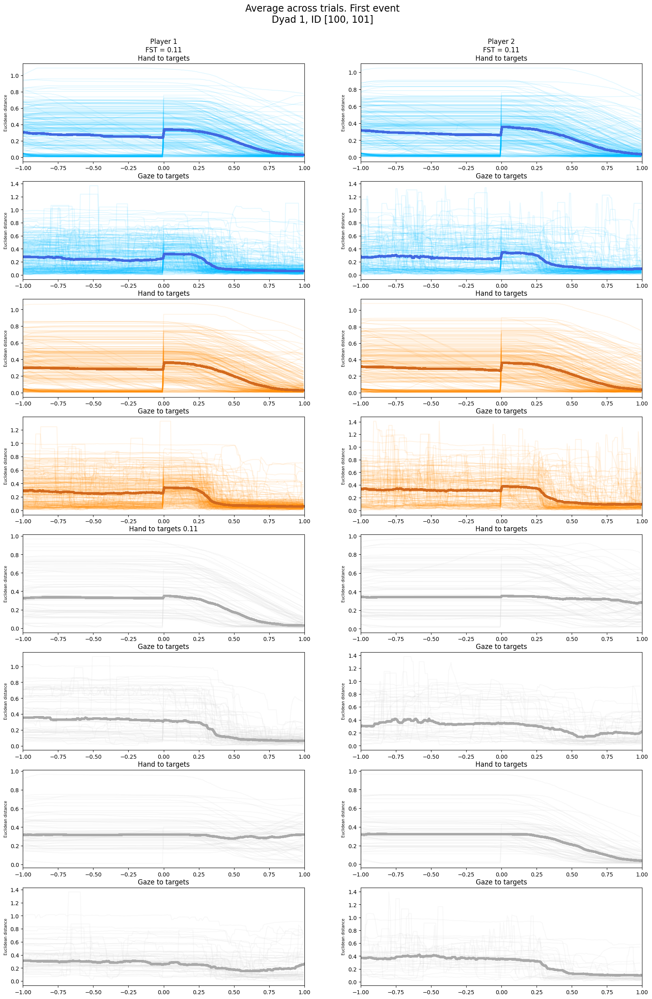

In [16]:
l=0
y=0
#blue= np.zeros(1000)
mean_h_bj_0_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in blue_joint and d1_b1_d_h_bj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
            mean_h_bj_0_s.append(d1_b1_d_h_bj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
    
h_bj_0_s = np.array(mean_h_bj_0_s)
mean_h_bj_0_s = np.nanmean(h_bj_0_s, axis=0)
median_h_bj_0_s = np.nanmedian(h_bj_0_s, axis=0)

mean_h_bj_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in blue_joint and d1_b1_d_h_bj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_h_bj_s.append(d1_b1_d_h_bj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
h_bj_s = np.array(mean_h_bj_s)
mean_h_bj_s = np.nanmean(h_bj_s, axis=0)
median_h_bj_s = np.nanmedian(h_bj_s, axis=0)

mean_e_bj_0_s = []
for trial_id in range(trials_number-1):
    
    if trial_end[trial_id+1] in blue_joint and d1_b1_d_e_bj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        l=l+1
        mean_e_bj_0_s.append(d1_b1_d_e_bj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
bj_0_s = np.array(mean_e_bj_0_s)
mean_e_bj_0_s = np.nanmean(mean_e_bj_0_s, axis=0)
median_e_bj_0_s = np.nanmedian(bj_0_s, axis=0)

print(len(blue_joint))
print(l)
mean_e_bj_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in blue_joint and d1_b1_d_e_bj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_e_bj_s.append(d1_b1_d_e_bj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
e_bj_s = np.array(mean_e_bj_s)
mean_e_bj_s = np.nanmean(e_bj_s, axis=0)
median_e_bj_s = np.nanmedian(e_bj_s, axis=0)
#yellow
mean_h_oj_0_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in yellow_joint and d1_b1_d_h_oj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_h_oj_0_s.append(d1_b1_d_h_oj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
h_oj_0_s = np.array(mean_h_oj_0_s)
mean_h_oj_0_s = np.nanmean(h_oj_0_s, axis=0)
median_h_oj_0_s = np.nanmedian(h_oj_0_s, axis=0)

mean_h_oj_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in yellow_joint and d1_b1_d_h_oj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_h_oj_s.append(d1_b1_d_h_oj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
h_oj_s = np.array(mean_h_oj_s)
mean_h_oj_s = np.nanmean(h_oj_s, axis=0)
median_h_oj_s = np.nanmedian(h_oj_s, axis=0)

mean_e_oj_0_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in yellow_joint and d1_b1_d_e_oj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        y=y+1
        mean_e_oj_0_s.append(d1_b1_d_e_oj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
e_oj_0_s = np.array(mean_e_oj_0_s)
mean_e_oj_0_s = np.nanmean(e_oj_0_s, axis=0)
median_e_oj_0_s = np.nanmedian(e_oj_0_s, axis=0)
print(len(yellow_joint))
print(y)
mean_e_oj_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in yellow_joint and d1_b1_d_e_oj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_e_oj_s.append(d1_b1_d_e_oj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
e_oj_s = np.array(mean_e_oj_s)
mean_e_oj_s = np.nanmean(e_oj_s, axis=0)
median_e_oj_s = np.nanmedian(e_oj_s, axis=0)

#white
mean_h_w_0_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in white_p0 and d1_b1_d_h_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_h_w_0_s.append(d1_b1_d_h_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
h_w_0_s = np.array(mean_h_w_0_s)
mean_h_w_0_s = np.nanmean(h_w_0_s, axis=0)
median_h_w_0_s = np.nanmedian(h_w_0_s, axis=0)

mean_h_w_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in white_p0 and d1_b1_d_h_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_h_w_s.append(d1_b1_d_h_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
h_w_s = np.array(mean_h_w_s)
mean_h_w_s = np.nanmean(h_w_s, axis=0)
median_h_w_s = np.nanmedian(h_w_s, axis=0)


mean_e_w_0_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in white_p0 and d1_b1_d_e_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_e_w_0_s.append(d1_b1_d_e_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
e_w_0_s = np.array(mean_e_w_0_s)
mean_e_w_0_s = np.nanmean(e_w_0_s, axis=0)
median_e_w_0_s = np.nanmedian(e_w_0_s, axis=0)



mean_e_w_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in white_p0 and d1_b1_d_e_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_e_w_s.append(d1_b1_d_e_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
e_w_s = np.array(mean_e_w_s)
mean_e_w_s = np.nanmean(e_w_s, axis=0)
median_e_w_s = np.nanmedian(e_w_s, axis=0)
#
mean_h_w_0_p1_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in white_p1 and d1_b1_d_h_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_h_w_0_p1_s.append(d1_b1_d_h_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
h_w_0_p1_s = np.array(mean_h_w_0_p1_s)
mean_h_w_0_p1_s = np.nanmean(h_w_0_p1_s, axis=0)
median_h_w_0_p1_s = np.nanmedian(h_w_0_p1_s, axis=0)
mean_h_w_p1_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in white_p1 and d1_b1_d_h_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_h_w_p1_s.append(d1_b1_d_h_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
h_w_p1_s = np.array(mean_h_w_p1_s)
mean_h_w_p1_s= np.nanmean(h_w_p1_s, axis=0)
median_h_w_p1_s= np.nanmedian(h_w_p1_s, axis=0)


mean_e_w_0_p1_s= []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in white_p1 and d1_b1_d_e_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_e_w_0_p1_s.append(d1_b1_d_e_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
e_w_0_p1_s = np.array(mean_e_w_0_p1_s)
mean_e_w_0_p1_s = np.nanmean(e_w_0_p1_s, axis=0)
median_e_w_0_p1_s = np.nanmedian(e_w_0_p1_s, axis=0)

mean_e_w_p1_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in white_p1 and d1_b1_d_e_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_e_w_p1_s.append(d1_b1_d_e_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
e_w_p1_s = np.array(mean_e_w_p1_s)
mean_e_w_p1_s = np.nanmean(e_w_p1_s, axis=0)
median_e_w_p1_s = np.nanmedian(e_w_p1_s, axis=0)




plt.figure(figsize=(20, 30))
plt.suptitle(f'Average across trials. First event\nDyad {game}, ID {dyad}',y=0.93,fontsize=17)
#plt.title(f'Dyad ID {dyad}, block {block}. Average across trials')
for trial_id in range(trials_number):
    if trial_end[trial_id+1] in blue_joint:
        plt.subplot(8,2,1)
        plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_h_bj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset],'-',c='deepskyblue',alpha=0.1)
        #plt.plot(np.linspace(-1, 1, 2*offset), mean_h_bj_0_s,c='royalblue',linewidth=4.0)
        plt.plot(np.linspace(-1, 1, 2*offset), median_h_bj_0_s,c='royalblue',linewidth=4.0)
        plt.xlim(-1,1)
        #b = np.array(d1_b1_d_h_bj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]])
# Pad array 'a' with zeros to match the shape of array 'b' 
        #b_padded = np.pad(b, (0, blue.shape[0] - b.shape[0]), mode='constant')
        #blue=b_padded+blue
        plt.title(f'Player 1\nFST = {FST_player1}\nHand to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        #plt.xlabel('Frames in seconds',fontsize=7)
# Perform the sum operation
        #x=(np.nanmean(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]] - frames[trial_end[trial_id]-offset] - 1))
        #y=(np.nanmean(d1_b1_d_h_bj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]])
        #y.append(d1_b1_d_h_bj_0.iloc[blue_joint[trial_id+1]-offset:trial_end[trial_id]]
        #plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]] - frames[trial_end[trial_id]-offset] - 1,y,'-','r')
        
        plt.subplot(8,2,2)
        plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_h_bj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset],'-',c='deepskyblue',alpha=0.1)
        #plt.plot(np.linspace(-1, 1, 2*offset), mean_h_bj_s,c='royalblue',linewidth=4.0)
        plt.plot(np.linspace(-1, 1, 2*offset), median_h_bj_s,c='royalblue',linewidth=4.0)
        plt.title(f'Player 2\nFST = {FST_player2}\nHand to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        #plt.xlabel('Frames in seconds',fontsize=7)
        plt.xlim(-1,1)
        
        plt.subplot(8,2,3)
        if d1_b1_d_e_bj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
            plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_e_bj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset],'-',c='deepskyblue',alpha=0.1)
        #plt.plot(np.linspace(-1, 1, 2*offset), mean_e_bj_0_s,c='royalblue',linewidth=4.0)
        plt.plot(np.linspace(-1, 1, 2*offset), median_e_bj_0_s,c='royalblue',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Gaze to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        #plt.ylim(0.00,1.41)
       # plt.xlabel('Frames in seconds',fontsize=7)
        
        plt.subplot(8,2,4)
        if d1_b1_d_e_bj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
            plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_e_bj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset],'-',c='deepskyblue',alpha=0.1)
        #plt.plot(np.linspace(-1, 1, 2*offset), mean_e_bj_s,c='royalblue',linewidth=4.0)
        plt.plot(np.linspace(-1, 1, 2*offset), median_e_bj_s,c='royalblue',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Gaze to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        #plt.ylim(0.00,1.41)
        #plt.xlabel('Frames in seconds',fontsize=7)
        
    elif trial_end[trial_id+1] in yellow_joint:
       
        plt.subplot(8,2,5)
        plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_h_oj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset],'-',c='darkorange',alpha=0.1)
        #plt.plot(np.linspace(-1, 1, 2*offset), mean_h_oj_0_s,c='chocolate',linewidth=4.0)
        plt.plot(np.linspace(-1, 1, 2*offset), median_h_oj_0_s,c='chocolate',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Hand to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        #plt.xlabel('Frames in seconds',fontsize=7)
        
        
        plt.subplot(8,2,6)
        plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_h_oj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset],'-',c='darkorange',alpha=0.1)
        #plt.plot(np.linspace(-1, 1, 2*offset), mean_h_oj_s,c='chocolate',linewidth=4.0)
        plt.plot(np.linspace(-1, 1, 2*offset), median_h_oj_s,c='chocolate',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Hand to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        #plt.xlabel('Frames in seconds',fontsize=7)
        
        
        plt.subplot(8,2,7)
        if d1_b1_d_e_oj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
            plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_e_oj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset],'-',c='darkorange',alpha=0.1)
        #plt.plot(np.linspace(-1, 1, 2*offset), mean_e_oj_0_s,c='chocolate',linewidth=4.0)
        plt.plot(np.linspace(-1, 1, 2*offset), median_e_oj_0_s,c='chocolate',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Gaze to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        #plt.xlabel('Frames in seconds',fontsize=7)
        #plt.ylim(0.00,1.41)
        
        plt.subplot(8,2,8)
        if d1_b1_d_e_oj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
            plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_e_oj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset],'-',c='darkorange',alpha=0.1)
        #plt.plot(np.linspace(-1, 1, 2*offset), mean_e_oj_s,c='chocolate',linewidth=4.0)
        plt.plot(np.linspace(-1, 1, 2*offset), median_e_oj_s,c='chocolate',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Gaze to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        #plt.xlabel('Frames in seconds',fontsize=7)
        #plt.ylim(0.00,1.41)
        
    elif trial_end[trial_id+1] in white_p0:
        
        plt.subplot(8,2,9)
        #plt.plot(np.linspace(-1, 1, 2*offset), mean_h_w_0_s,c='darkgrey',linewidth=4.0)
        plt.plot(np.linspace(-1, 1, 2*offset), median_h_w_0_s,c='darkgrey',linewidth=4.0)
        plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_h_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset],'-',c='gainsboro',alpha=0.2)
        plt.xlim(-1,1)
        plt.title(f'Hand to targets {FST_player1}')
        plt.ylabel('Euclidean distance',fontsize=7)
        #plt.xlabel('Frames in seconds',fontsize=7)
        
        plt.subplot(8,2,10)
        plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_h_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset],'-',c='gainsboro',alpha=0.2)
        #plt.plot(np.linspace(-1, 1, 2*offset), mean_h_w_s,c='darkgrey',linewidth=4.0)
        plt.plot(np.linspace(-1, 1, 2*offset), median_h_w_s,c='darkgrey',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Hand to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        #plt.xlabel('Frames in seconds',fontsize=7)
        
        plt.subplot(8,2,11)
        if d1_b1_d_e_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
            plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_e_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset],'-',c='gainsboro',alpha=0.2)
        #plt.plot(np.linspace(-1, 1, 2*offset), mean_e_w_0_s,c='darkgrey',linewidth=4.0)
        plt.plot(np.linspace(-1, 1, 2*offset), median_e_w_0_s,c='darkgrey',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Gaze to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        #plt.xlabel('Frames in seconds',fontsize=7)
        #plt.ylim(0.00,1.41)
        
        plt.subplot(8,2,12)
        if d1_b1_d_e_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
            plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_e_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset],'-',c='gainsboro',alpha=0.2)
        #plt.plot(np.linspace(-1, 1, 2*offset), mean_e_w_s,c='darkgrey',linewidth=4.0)
        plt.plot(np.linspace(-1, 1, 2*offset), median_e_w_s,c='darkgrey',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Gaze to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        #plt.xlabel('Frames in seconds',fontsize=7)
        #plt.ylim(0.00,1.41)
    elif trial_end[trial_id+1] in white_p1:
        
        plt.subplot(8,2,13)
        #plt.plot(np.linspace(-1, 1, 2*offset), mean_h_w_0_p1_s,c='darkgrey',linewidth=4.0)
        plt.plot(np.linspace(-1, 1, 2*offset), median_h_w_0_p1_s,c='darkgrey',linewidth=4.0)
        plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_h_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset],'-',c='gainsboro',alpha=0.2)
        plt.xlim(-1,1)
        plt.title(f'Hand to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        #plt.xlabel('Frames in seconds',fontsize=7)
        
        plt.subplot(8,2,14)
        plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_h_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset],'-',c='gainsboro',alpha=0.2)
        #plt.plot(np.linspace(-1, 1, 2*offset), mean_h_w_p1_s,c='darkgrey',linewidth=4.0)
        plt.plot(np.linspace(-1, 1, 2*offset), median_h_w_p1_s,c='darkgrey',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Hand to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        #plt.xlabel('Frames in seconds',fontsize=7)
        
        plt.subplot(8,2,15)
        if d1_b1_d_e_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
            plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_e_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset],'-',c='gainsboro',alpha=0.2)
        #plt.plot(np.linspace(-1, 1, 2*offset), mean_e_w_0_p1_s,c='darkgrey',linewidth=4.0)
        plt.plot(np.linspace(-1, 1, 2*offset), median_e_w_0_p1_s,c='darkgrey',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Gaze to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        #plt.xlabel('Frames in seconds',fontsize=7)
        
        plt.subplot(8,2,16)
        if d1_b1_d_e_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
            plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_e_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset],'-',c='gainsboro',alpha=0.2)
        #plt.plot(np.linspace(-1, 1, 2*offset), mean_e_w_p1_s,c='darkgrey',linewidth=4.0)
        plt.plot(np.linspace(-1, 1, 2*offset), median_e_w_p1_s,c='darkgrey',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Gaze to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        #plt.xlabel('Frames in seconds',fontsize=7)
        #plt.ylim(0.00,1.41)
    else: 
        print("There is a mistake")

#blue=blue/len(blue_joint)

#plt.subplot(4,2,2)

#plt.plot(np.linspace(-1,25,1000), blue,'-',c='red' )
#plt.subplot(4,2,2)
#plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]] - frames[trial_end[trial_id]-offset] - 1, blue,'-','r' )
#plt.suptitle(f'Dyad ID {dyad}, block {block}. Average across trials', fontsize=14)


There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a m

KeyError: 144774

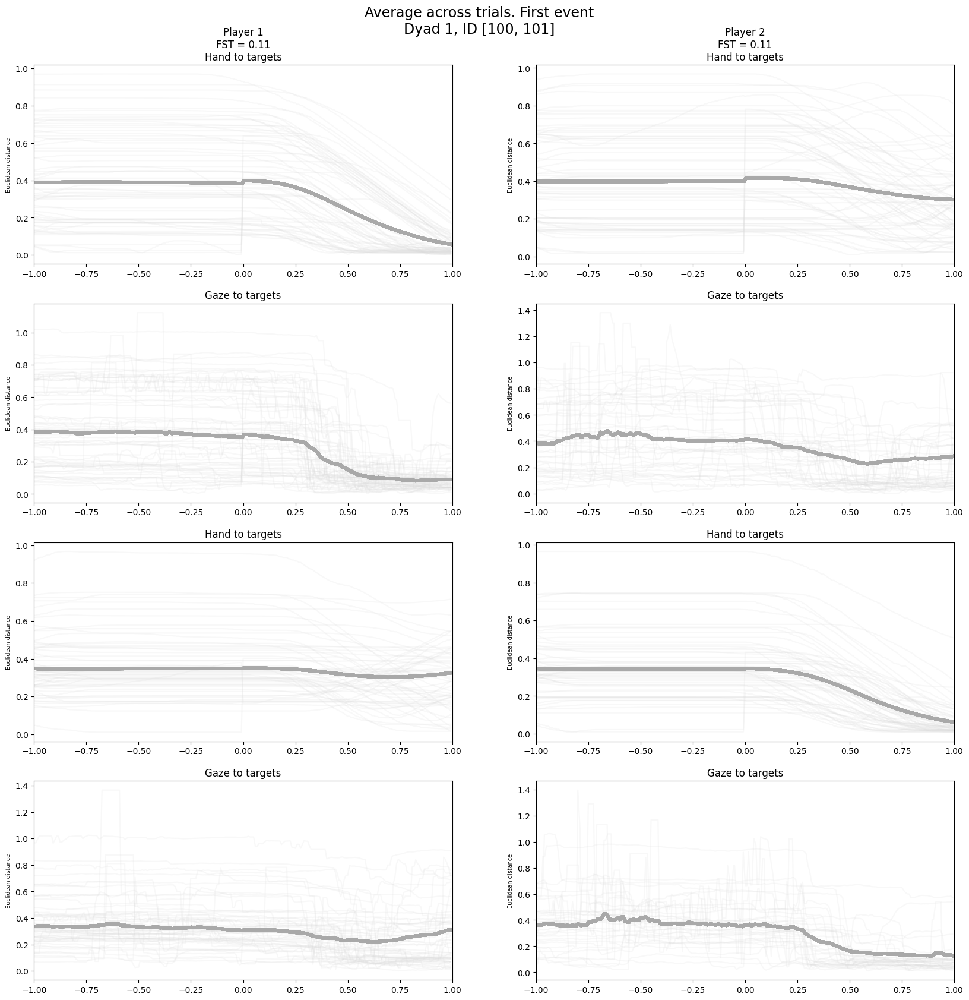

In [17]:
#blue= np.zeros(1000)
mean_h_bj_0_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in blue_joint and d1_b1_d_h_bj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
            mean_h_bj_0_s.append(d1_b1_d_h_bj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
    
mean_h_bj_0_s = np.array(mean_h_bj_0_s)
mean_h_bj_0_s = np.nanmean(mean_h_bj_0_s, axis=0)

mean_h_bj_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in blue_joint and d1_b1_d_h_bj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_h_bj_s.append(d1_b1_d_h_bj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
mean_h_bj_s = np.array(mean_h_bj_s)
mean_h_bj_s = np.nanmean(mean_h_bj_s, axis=0)

mean_e_bj_0_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in blue_joint and d1_b1_d_e_bj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_e_bj_0_s.append(d1_b1_d_e_bj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
mean_e_bj_0_s = np.array(mean_e_bj_0_s)
mean_e_bj_0_s = np.nanmean(mean_e_bj_0_s, axis=0)

mean_e_bj_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in blue_joint and d1_b1_d_e_bj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_e_bj_s.append(d1_b1_d_e_bj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
mean_e_bj_s = np.array(mean_e_bj_s)
mean_e_bj_s = np.nanmean(mean_e_bj_s, axis=0)

#yellow
mean_h_oj_0_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in yellow_joint and d1_b1_d_h_oj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_h_oj_0_s.append(d1_b1_d_h_oj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
mean_h_oj_0_s = np.array(mean_h_oj_0_s)
mean_h_oj_0_s = np.nanmean(mean_h_oj_0_s, axis=0)

mean_h_oj_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in yellow_joint and d1_b1_d_h_oj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_h_oj_s.append(d1_b1_d_h_oj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
mean_h_oj_s = np.array(mean_h_oj_s)
mean_h_oj_s = np.nanmean(mean_h_oj_s, axis=0)

mean_e_oj_0_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in yellow_joint and d1_b1_d_e_oj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_e_oj_0_s.append(d1_b1_d_e_oj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
mean_e_oj_0_s = np.array(mean_e_oj_0_s)
mean_e_oj_0_s = np.nanmean(mean_e_oj_0_s, axis=0)

mean_e_oj_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in yellow_joint and d1_b1_d_e_oj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_e_oj_s.append(d1_b1_d_e_oj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
mean_e_oj_s = np.array(mean_e_oj_s)
mean_e_oj_s = np.nanmean(mean_e_oj_s, axis=0)

#white
mean_h_w_0_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in white_p0 and d1_b1_d_h_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_h_w_0_s.append(d1_b1_d_h_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
mean_h_w_0_s = np.array(mean_h_w_0_s)
mean_h_w_0_s = np.nanmean(mean_h_w_0_s, axis=0)

mean_h_w_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in white_p0 and d1_b1_d_h_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_h_w_s.append(d1_b1_d_h_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
mean_h_w_s = np.array(mean_h_w_s)
mean_h_w_s = np.nanmean(mean_h_w_s, axis=0)

mean_e_w_0_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in white_p0 and d1_b1_d_e_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_e_w_0_s.append(d1_b1_d_e_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
mean_e_w_0_s = np.array(mean_e_w_0_s)
mean_e_w_0_s = np.nanmean(mean_e_w_0_s, axis=0)

mean_e_w_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in white_p0 and d1_b1_d_e_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_e_w_s.append(d1_b1_d_e_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
mean_e_w_s = np.array(mean_e_w_s)
mean_e_w_s = np.nanmean(mean_e_w_s, axis=0)
#
mean_h_w_0_p1_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in white_p1 and d1_b1_d_h_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_h_w_0_p1_s.append(d1_b1_d_h_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
mean_h_w_0_p1_s = np.array(mean_h_w_0_p1_s)
mean_h_w_0_p1_s = np.nanmean(mean_h_w_0_p1_s, axis=0)

mean_h_w_p1_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in white_p1 and d1_b1_d_h_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_h_w_p1_s.append(d1_b1_d_h_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
mean_h_w_p1_s = np.array(mean_h_w_p1_s)
mean_h_w_p1_s= np.nanmean(mean_h_w_p1_s, axis=0)

mean_e_w_0_p1_s= []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in white_p1 and d1_b1_d_e_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_e_w_0_p1_s.append(d1_b1_d_e_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
mean_e_w_0_p1_s = np.array(mean_e_w_0_p1_s)
mean_e_w_0_p1_s = np.nanmean(mean_e_w_0_p1_s, axis=0)

mean_e_w_p1_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in white_p1 and d1_b1_d_e_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_e_w_p1_s.append(d1_b1_d_e_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
mean_e_w_p1_s = np.array(mean_e_w_p1_s)
mean_e_w_p1_s = np.nanmean(mean_e_w_p1_s, axis=0)



plt.figure(figsize=(20, 20))
plt.suptitle(f'Average across trials. First event\nDyad {game}, ID {dyad}',y=0.93,fontsize=17)
#plt.title(f'Dyad ID {dyad}, block {block}. Average across trials')
for trial_id in range(trials_number):
   
        #plt.ylim(0.00,1.41)
        
    if trial_end[trial_id+1] in white_p0:
        
        plt.subplot(4,2,1)
        plt.plot(np.linspace(-1, 1, 2*offset), mean_h_w_0_s,c='darkgrey',linewidth=4.0)
        plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_h_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset],'-',c='gainsboro',alpha=0.2)
        plt.xlim(-1,1)
        plt.title(f'Player 1\nFST = {FST_player1}\nHand to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        #plt.xlabel('Frames in seconds',fontsize=7)
        
        plt.subplot(4,2,2)
        plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_h_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset],'-',c='gainsboro',alpha=0.2)
        plt.plot(np.linspace(-1, 1, 2*offset), mean_h_w_s,c='darkgrey',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Player 2\nFST = {FST_player2}\nHand to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        #plt.xlabel('Frames in seconds',fontsize=7)
        
        plt.subplot(4,2,3)
        if d1_b1_d_e_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
            plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_e_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset],'-',c='gainsboro',alpha=0.2)
        plt.plot(np.linspace(-1, 1, 2*offset), mean_e_w_0_s,c='darkgrey',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Gaze to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        #plt.xlabel('Frames in seconds',fontsize=7)
        #plt.ylim(0.00,1.41)
        
        plt.subplot(4,2,4)
        if d1_b1_d_e_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
            plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_e_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset],'-',c='gainsboro',alpha=0.2)
        plt.plot(np.linspace(-1, 1, 2*offset), mean_e_w_s,c='darkgrey',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Gaze to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        #plt.xlabel('Frames in seconds',fontsize=7)
        #plt.ylim(0.00,1.41)
    elif trial_end[trial_id+1] in white_p1:
        
        plt.subplot(4,2,5)
        plt.plot(np.linspace(-1, 1, 2*offset), mean_h_w_0_p1_s,c='darkgrey',linewidth=4.0)
        plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_h_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset],'-',c='gainsboro',alpha=0.2)
        plt.xlim(-1,1)
        plt.title(f'Hand to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        #plt.xlabel('Frames in seconds',fontsize=7)
        
        plt.subplot(4,2,6)
        plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_h_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset],'-',c='gainsboro',alpha=0.2)
        plt.plot(np.linspace(-1, 1, 2*offset), mean_h_w_p1_s,c='darkgrey',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Hand to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        #plt.xlabel('Frames in seconds',fontsize=7)
        
        plt.subplot(4,2,7)
        if d1_b1_d_e_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
            plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_e_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset],'-',c='gainsboro',alpha=0.2)
        plt.plot(np.linspace(-1, 1, 2*offset), mean_e_w_0_p1_s,c='darkgrey',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Gaze to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        #plt.xlabel('Frames in seconds',fontsize=7)
        
        plt.subplot(4,2,8)
        if d1_b1_d_e_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
            plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_e_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset],'-',c='gainsboro',alpha=0.2)
        plt.plot(np.linspace(-1, 1, 2*offset), mean_e_w_p1_s,c='darkgrey',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Gaze to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        #plt.xlabel('Frames in seconds',fontsize=7)
        #plt.ylim(0.00,1.41)
    else: 
        print("There is a mistake")

#blue=blue/len(blue_joint)

#plt.subplot(4,2,2)

#plt.plot(np.linspace(-1,25,1000), blue,'-',c='red' )
#plt.subplot(4,2,2)
#plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]] - frames[trial_end[trial_id]-offset] - 1, blue,'-','r' )
#plt.suptitle(f'Dyad ID {dyad}, block {block}. Average across trials', fontsize=14)


There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a mistake
There is a m

KeyError: 144825

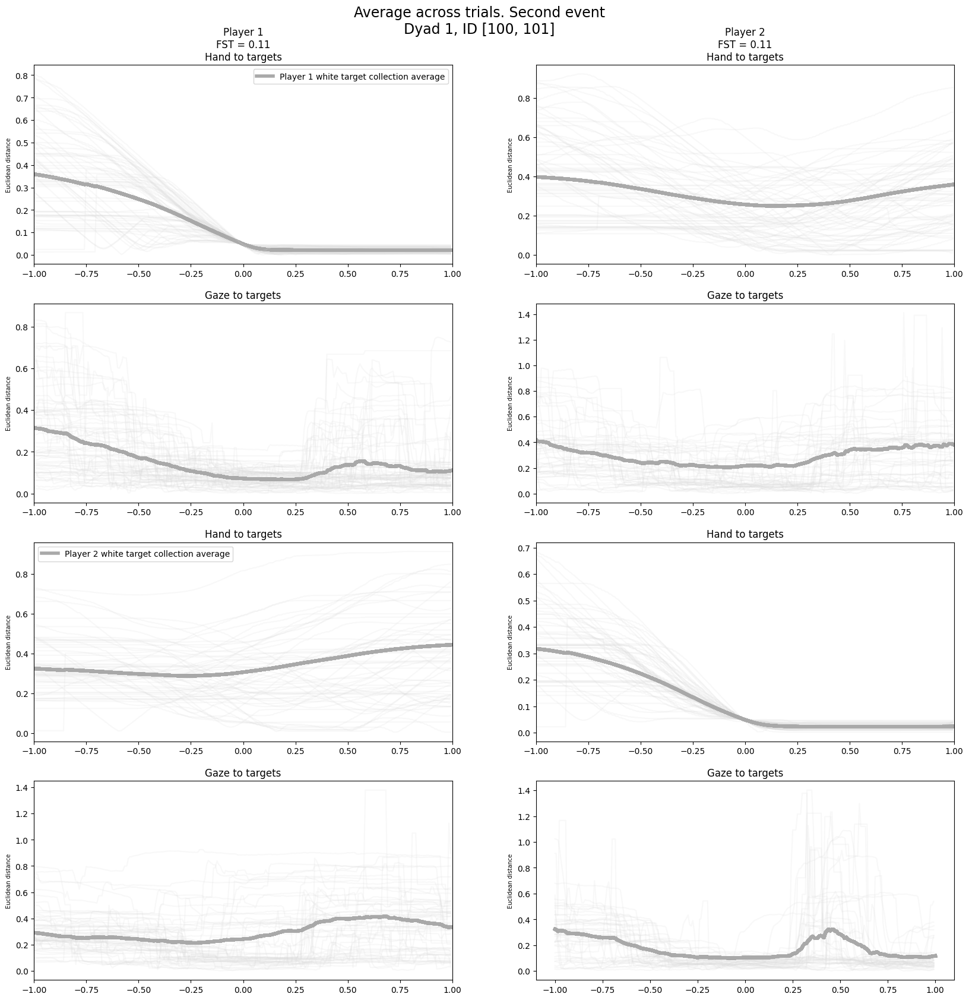

In [19]:
mean_h_bj_0 = []
for id in blue_joint:
    if d1_b1_d_h_bj_0.iloc[id-2*offset:id].max()<2**(1/2):
        mean_h_bj_0.append(d1_b1_d_h_bj_0.iloc[id-2*offset:id])
mean_h_bj_0 = np.array(mean_h_bj_0)
mean_h_bj_0 = np.nanmean(mean_h_bj_0, axis=0)

mean_h_bj = []
for id in blue_joint:
    if d1_b1_d_h_bj.iloc[id-2*offset:id].max()<2**(1/2):
        mean_h_bj.append(d1_b1_d_h_bj.iloc[id-2*offset:id])
mean_h_bj = np.array(mean_h_bj)
mean_h_bj = np.nanmean(mean_h_bj, axis=0)

mean_e_bj_0 = []
for id in blue_joint:
    if d1_b1_d_e_bj_0.iloc[id-2*offset:id].max()<2**(1/2):
        mean_e_bj_0.append(d1_b1_d_e_bj_0.iloc[id-2*offset:id])
mean_e_bj_0 = np.array(mean_e_bj_0)
mean_e_bj_0 = np.nanmean(mean_e_bj_0, axis=0)

mean_e_bj = []
for id in blue_joint:
     if d1_b1_d_e_bj.iloc[id-2*offset:id].max()<2**(1/2):
         mean_e_bj.append(d1_b1_d_e_bj.iloc[id-2*offset:id])
mean_e_bj = np.array(mean_e_bj)
mean_e_bj = np.nanmean(mean_e_bj, axis=0)

mean_h_oj_0 = []
for id in yellow_joint:
    if d1_b1_d_h_oj_0.iloc[id-2*offset:id].max()<2**(1/2):
        mean_h_oj_0.append(d1_b1_d_h_oj_0.iloc[id-2*offset:id])
mean_h_oj_0 = np.array(mean_h_oj_0)
mean_h_oj_0 = np.nanmean(mean_h_oj_0, axis=0)

mean_h_oj = []
for id in yellow_joint:
    if d1_b1_d_h_oj.iloc[id-2*offset:id].max()<2**(1/2):
        mean_h_oj.append(d1_b1_d_h_oj.iloc[id-2*offset:id])
mean_h_oj = np.array(mean_h_oj)
mean_h_oj = np.nanmean(mean_h_oj, axis=0)

mean_e_oj_0 = []
for id in yellow_joint:
    if d1_b1_d_e_oj_0.iloc[id-2*offset:id].max()<2**(1/2):
        mean_e_oj_0.append(d1_b1_d_e_oj_0.iloc[id-2*offset:id])
mean_e_oj_0 = np.array(mean_e_oj_0)
mean_e_oj_0 = np.nanmean(mean_e_oj_0, axis=0)

mean_e_oj = []
for id in yellow_joint:
    if d1_b1_d_e_oj.iloc[id-2*offset:id].max()<2**(1/2):
        mean_e_oj.append(d1_b1_d_e_oj.iloc[id-2*offset:id])
mean_e_oj = np.array(mean_e_oj)
mean_e_oj = np.nanmean(mean_e_oj, axis=0)

mean_h_w_0 = []
for id in white_p0:
    if d1_b1_d_h_w_0.iloc[id-2*offset:id].max()<2**(1/2):
        mean_h_w_0.append(d1_b1_d_h_w_0.iloc[id-2*offset:id])
mean_h_w_0 = np.array(mean_h_w_0)
mean_h_w_0 = np.nanmean(mean_h_w_0, axis=0)

mean_h_w = []
for id in white_p0:
    if d1_b1_d_h_w.iloc[id-2*offset:id].max()<2**(1/2):
        mean_h_w.append(d1_b1_d_h_w.iloc[id-2*offset:id])
mean_h_w = np.array(mean_h_w)
mean_h_w = np.nanmean(mean_h_w, axis=0)

mean_e_w_0 = []
for id in white_p0:
    if d1_b1_d_e_w_0.iloc[id-2*offset:id].max()<2**(1/2):
        mean_e_w_0.append(d1_b1_d_e_w_0.iloc[id-2*offset:id])
mean_e_w_0 = np.array(mean_e_w_0)
mean_e_w_0 = np.nanmean(mean_e_w_0, axis=0)

mean_e_w = []
for id in white_p0:
    if d1_b1_d_e_w.iloc[id-2*offset:id].max()<2**(1/2):
        mean_e_w.append(d1_b1_d_e_w.iloc[id-2*offset:id])
mean_e_w = np.array(mean_e_w)
mean_e_w = np.nanmean(mean_e_w, axis=0)
#
mean_h_w_0_p1 = []
for id in white_p1:
    if d1_b1_d_h_w_0.iloc[id-2*offset:id].max()<2**(1/2):
        mean_h_w_0_p1.append(d1_b1_d_h_w_0.iloc[id-2*offset:id])
mean_h_w_0_p1 = np.array(mean_h_w_0_p1)
mean_h_w_0_p1 = np.nanmean(mean_h_w_0_p1, axis=0)

mean_h_w_p1 = []
for id in white_p1:
    if d1_b1_d_h_w.iloc[id-2*offset:id].max()<2**(1/2):
        mean_h_w_p1.append(d1_b1_d_h_w.iloc[id-2*offset:id])
mean_h_w_p1 = np.array(mean_h_w_p1)
mean_h_w_p1= np.nanmean(mean_h_w_p1, axis=0)

mean_e_w_0_p1= []
for id in white_p1:
    if d1_b1_d_e_w_0.iloc[id-2*offset:id].max()<2**(1/2):
        mean_e_w_0_p1.append(d1_b1_d_e_w_0.iloc[id-2*offset:id])
mean_e_w_0_p1 = np.array(mean_e_w_0_p1)
mean_e_w_0_p1 = np.nanmean(mean_e_w_0_p1, axis=0)

mean_e_w_p1 = []
for id in white_p1:
    if d1_b1_d_e_w.iloc[id-2*offset:id].max()<2**(1/2):
        mean_e_w_p1.append(d1_b1_d_e_w.iloc[id-2*offset:id])
mean_e_w_p1 = np.array(mean_e_w_p1)
mean_e_w_p1 = np.nanmean(mean_e_w_p1, axis=0)

plt.figure(figsize=(20, 20))
plt.suptitle(f'Average across trials. Second event\nDyad {game}, ID {dyad}',y=0.93,fontsize=17)
for trial_id in range(trials_number):
    if trial_end[trial_id+1] in white_p0:
    #w_p0_h_p0
        plt.subplot(4,2,1)
        plt.plot(np.linspace(-1, 1, 2*offset), mean_h_w_0,c='darkgrey',linewidth=4.0)
        plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_h_w_0.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='gainsboro',alpha=0.2)
        plt.xlim(-1,1)
        plt.title(f'Player 1\nFST = {FST_player1}\nHand to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        plt.legend(['Player 1 white target collection average'])
     #w_p0_h_p1   
        plt.subplot(4,2,2)
        plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_h_w.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='gainsboro',alpha=0.2)
        plt.plot(np.linspace(-1, 1, 2*offset), mean_h_w,c='darkgrey',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Player 2\nFST = {FST_player2}\nHand to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
    #w_p0_e_p0
        plt.subplot(4,2,3)
        if d1_b1_d_e_w_0.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]].max()<2**(1/2):
            plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_e_w_0.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='gainsboro',alpha=0.2)
        plt.plot(np.linspace(-1, 1, 2*offset), mean_e_w_0,c='darkgrey',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Gaze to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
    #w_p0_e_p1 
        plt.subplot(4,2,4)
        if d1_b1_d_e_w.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]].max()<2**(1/2):
            plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_e_w.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='gainsboro',alpha=0.2)
        plt.plot(np.linspace(-1, 1, 2*offset), mean_e_w,c='darkgrey',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Gaze to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        
    elif trial_end[trial_id+1] in white_p1:
    #w_p1_h_p0 
        plt.subplot(4,2,5)
        plt.plot(np.linspace(-1, 1, 2*offset), mean_h_w_0_p1,c='darkgrey',linewidth=4.0)
        plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_h_w_0.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='gainsboro',alpha=0.2)
        plt.title(f'Hand to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        plt.legend(['Player 2 white target collection average'])
        plt.xlim(-1,1)    
    #w_p1_h_p1  
        plt.subplot(4,2,6)
        plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_h_w.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='gainsboro',alpha=0.2)
        plt.plot(np.linspace(-1, 1, 2*offset), mean_h_w_p1,c='darkgrey',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Hand to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
    #w_p1_e_p0
        plt.subplot(4,2,7)
        if d1_b1_d_e_w_0.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]].max()<2**(1/2):
            plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_e_w_0.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='gainsboro',alpha=0.2)
        plt.plot(np.linspace(-1, 1, 2*offset), mean_e_w_0_p1,c='darkgrey',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Gaze to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        plt.xlim(-1,1)
    #w_p1_e_p1
        plt.subplot(4,2,8)
        if d1_b1_d_e_w.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]].max()<2**(1/2):
            plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_e_w.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='gainsboro',alpha=0.2)
        plt.plot(np.linspace(-1, 1, 2*offset), mean_e_w_p1,c='darkgrey',linewidth=4.0)
        plt.title(f'Gaze to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
    else: 
        a=1



In [31]:
#d1_b1=[records['[100, 101]'], records ['[102, 103]'], records['[104, 105]'], records['[200, 201]'], records['[202, 203]'], records['[204, 205]'], records['[206, 207]'], records['[208, 209]'], records['[300, 301]'], records['[304, 305]'], records['[306, 307]'], records['[308, 309]'], records['[310, 311]']]
      2 #d1_b1=pd.concat(d1_b1)
----> 3 d1_b1 = pd.concat(records, keys=['[100, 101]', '[102, 103]', '[104, 105]', '[200, 201]', '[202, 203]', '[204, 205]', '[206, 207]', '[208, 209]', '[210, 211]', '[300, 301]', '[304, 305]', '[306, 307]', '[308, 309]', '[310, 311]'])

TypeError: cannot concatenate object of type '<class 'dict'>'; only Series and DataFrame objs are valid

In [37]:
for i in range (1,9):
    print(i)

1
2
3
4
5
6
7
8


In [ ]:
for game in range(1,9) + range(10, 15):
    if game==1:
        dyad='[100, 101]'
    elif game==2:
        dyad='[102, 103]'
    elif game==3:
        dyad='[104, 105]'
    elif game==4:
        dyad='[200, 201]'
    elif game==5:
        dyad='[202, 203]'
    elif game==6:
        dyad='[204, 205]'
    elif game==7:
        dyad='[206, 207]'
    elif game==8:
        dyad='[208, 209]'
    elif game==9:
        dyad='[210, 211]'
    elif game==10:
        dyad='[300, 301]'
    elif game==11:
        dyad='[304, 305]'
    elif game==12:
        dyad='[306, 307]'
    elif game==13:
        dyad='[308, 309]'
    elif game==14:
        dyad='[310, 311]'
        
    if len(records[dyad].keys())==3:  
    d1_b1=[records[dyad][1], records[dyad][2], records[dyad][3]]
    d1_b1=pd.concat(d1_b1)
    elif len(records[dyad].keys())==2:
    d1_b1=[records[dyad][1], records[dyad][2]]
    d1_b1=pd.concat(d1_b1)
    
    d1_b1_d_h_w_0=((d1_b1['p0_agent_x'] - d1_b1['comp_x'])**2+(d1_b1['p0_agent_y'] - d1_b1['comp_y'])**2)**(1/2)#hand/cursor to targets
    d1_b1_d_h_oj_0=((d1_b1['p0_agent_x'] - d1_b1['coop1_x'])**2+(d1_b1['p0_agent_y'] - d1_b1['coop1_y'])**2)**(1/2)
    d1_b1_d_h_bj_0=((d1_b1['p0_agent_x'] - d1_b1['coop0_x'])**2+(d1_b1['p0_agent_y'] - d1_b1['coop0_y'])**2)**(1/2)
    d1_b1_d_e_w_0=((d1_b1['p0_gaze_x'] - d1_b1['comp_x'])**2+(d1_b1['p0_gaze_y'] - d1_b1['comp_y'])**2)**(1/2)#eye to targets
    d1_b1_d_e_oj_0=((d1_b1['p0_gaze_x'] - d1_b1['coop1_x'])**2+(d1_b1['p0_gaze_y'] - d1_b1['coop1_y'])**2)**(1/2)
    d1_b1_d_e_bj_0=((d1_b1['p0_gaze_x'] - d1_b1['coop0_x'])**2+(d1_b1['p0_gaze_y'] - d1_b1['coop0_y'])**2)**(1/2)

    d1_b1_d_h_w=((d1_b1['p1_agent_x'] - d1_b1['comp_x'])**2+(d1_b1['p1_agent_y'] - d1_b1['comp_y'])**2)**(1/2)#hand/cursor to targets
    d1_b1_d_h_oj=((d1_b1['p1_agent_x'] - d1_b1['coop1_x'])**2+(d1_b1['p1_agent_y'] - d1_b1['coop1_y'])**2)**(1/2)
    d1_b1_d_h_bj=((d1_b1['p1_agent_x'] - d1_b1['coop0_x'])**2+(d1_b1['p1_agent_y'] - d1_b1['coop0_y'])**2)**(1/2)
    d1_b1_d_e_w=((d1_b1['p1_gaze_x'] - d1_b1['comp_x'])**2+(d1_b1['p1_gaze_y'] - d1_b1['comp_y'])**2)**(1/2)#eye to targets
    d1_b1_d_e_oj=((d1_b1['p1_gaze_x'] - d1_b1['coop1_x'])**2+(d1_b1['p1_gaze_y'] - d1_b1['coop1_y'])**2)**(1/2)
    d1_b1_d_e_bj=((d1_b1['p1_gaze_x'] - d1_b1['coop0_x'])**2+(d1_b1['p1_gaze_y'] - d1_b1['coop0_y'])**2)**(1/2)
    sum_c=d1_b1['comp_collected_by_p0']+d1_b1['comp_collected_by_p1'] + d1_b1['coop0_collected']+d1_b1['coop1_collected']  
    trial_end=list(np.where(sum_c>0)[0])
    trials_number=len(trial_end)
    print(trials_number)
    white_p0=list(np.where(d1_b1['comp_collected_by_p0']>0)[0])
    white_p1=list(np.where(d1_b1['comp_collected_by_p1']>0)[0])
    blue_joint=list(np.where(d1_b1['coop0_collected']>0)[0])
    yellow_joint=list(np.where(d1_b1['coop1_collected']>0)[0])
    #blue
    mean_h_bj_0_1 = []
    mean_e_bj_0_1 = []
    for id in blue_joint:
        if d1_b1_d_h_bj_0.iloc[id-2*offset:id].max()<2**(1/2):
            mean_h_bj_0_1.append(d1_b1_d_h_bj_0.iloc[id-2*offset:id])
        if d1_b1_d_h_bj.iloc[id-2*offset:id].max()<2**(1/2):
            mean_h_bj_0_1.append(d1_b1_d_h_bj.iloc[id-2*offset:id])
        if d1_b1_d_e_bj_0.iloc[id-2*offset:id].max()<2**(1/2):
            mean_e_bj_0_1.append(d1_b1_d_e_bj_0.iloc[id-2*offset:id])
        if d1_b1_d_e_bj.iloc[id-2*offset:id].max()<2**(1/2):
            mean_e_bj_0_1.append(d1_b1_d_e_bj.iloc[id-2*offset:id])
    mean_h_bj_0_1 = np.array(mean_h_bj_0_1)
    mean_h_bj_0_1 = np.nanmean(mean_h_bj_0_1, axis=0)
    
    mean_e_bj_0_1 = np.array(mean_e_bj_0_1)
    mean_e_bj_0_1 = np.nanmean(mean_e_bj_0_1, axis=0)
    #yellow
    mean_h_oj_0_1 = []
    mean_e_oj_0_1 = []
    for id in yellow_joint:
        if d1_b1_d_h_oj_0.iloc[id-2*offset:id].max()<2**(1/2):
            mean_h_oj_0_1.append(d1_b1_d_h_oj_0.iloc[id-2*offset:id])
        if d1_b1_d_h_oj.iloc[id-2*offset:id].max()<2**(1/2):
            mean_h_oj_0_1.append(d1_b1_d_h_oj.iloc[id-2*offset:id])
        if d1_b1_d_e_oj.iloc[id-2*offset:id].max()<2**(1/2):
            mean_e_oj_0_1.append(d1_b1_d_e_oj.iloc[id-2*offset:id])
        if d1_b1_d_e_oj.iloc[id-2*offset:id].max()<2**(1/2):
            mean_e_oj_0_1.append(d1_b1_d_e_oj.iloc[id-2*offset:id])
    mean_h_oj_0_1 = np.array(mean_h_oj_0_1)
    mean_h_oj_0_1 = np.nanmean(mean_h_oj_0_1, axis=0)
    
    mean_e_oj_0_1 = np.array(mean_e_oj_0_1)
    mean_e_oj_0_1 = np.nanmean(mean_e_oj_0_1, axis=0)
    #white
    mean_h_w_0_1 = []
    mean_e_w_0_1 = []
    for id in white_p0:
        if d1_b1_d_h_w_0.iloc[id-2*offset:id].max()<2**(1/2):
            mean_h_w_0_1.append(d1_b1_d_h_w_0.iloc[id-2*offset:id])
    mean_h_w_0_1 = np.array(mean_h_w_0_1)
    mean_h_w_0_1 = np.nanmean(mean_h_w_0_1, axis=0)
        if d1_b1_d_e_w_0.iloc[id-2*offset:id].max()<2**(1/2):
            mean_e_w_0_1.append(d1_b1_d_e_w_0.iloc[id-2*offset:id])
    mean_e_w_0_1 = np.array(mean_e_w_0_1)
    mean_e_w_0_1 = np.nanmean(mean_e_w_0_1, axis=0)
    
    for id in white_p1:
        if d1_b1_d_h_w.iloc[id-2*offset:id].max()<2**(1/2):
            mean_h_w_0_1.append(d1_b1_d_h_w.iloc[id-2*offset:id])
    mean_h_w_0_1 = np.array(mean_h_w_0_1)
    mean_h_w_0_1= np.nanmean(mean_h_w_0_1, axis=0)

        if d1_b1_d_e_w.iloc[id-2*offset:id].max()<2**(1/2):
            mean_e_w_0_1.append(d1_b1_d_e_w.iloc[id-2*offset:id])
    mean_e_w_0_1 = np.array(mean_e_w_0_1)
    mean_e_w_0_1 = np.nanmean(mean_e_w_0_1, axis=0)
    
    
plt.figure(figsize=(20, 30))
plt.suptitle(f'Average across dyads. Second event',y=0.93,fontsize=17)
plt.subplot()
        plt.subplot(8,2,1)
        plt.plot(np.linspace(-1, 1, 2*offset), mean_h_bj_0,c='royalblue',linewidth=4.0)
        plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_h_bj_0.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='deepskyblue',alpha=0.1)
        plt.xlim(-1,1)
        plt.title(f'Player 1\nFST = {FST_player1}\nHand to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        plt.legend(['Blue target collection average'])

     #h_bj
        plt.subplot(8,2,2)
        plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_h_bj.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='deepskyblue',alpha=0.1)
        plt.plot(np.linspace(-1, 1, 2*offset), mean_h_bj,c='royalblue',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Player 2\nFST = {FST_player2}\nHand to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
    #e_bj_0
        plt.subplot(8,2,3)
        if d1_b1_d_e_bj_0.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]].max()<2**(1/2):
            plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_e_bj_0.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='deepskyblue',alpha=0.1)
            m=m+1
        plt.plot(np.linspace(-1, 1, 2*offset), mean_e_bj_0,c='royalblue',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Gaze to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
    #e_bj
        plt.subplot(8,2,4)
        if d1_b1_d_e_bj.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]].max()<2**(1/2):
            plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_e_bj.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='deepskyblue',alpha=0.1)
        plt.plot(np.linspace(-1, 1, 2*offset), mean_e_bj,c='royalblue',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Gaze to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        
    elif trial_end[trial_id+1] in yellow_joint:
    #h_oj_0
        plt.subplot(8,2,5)
        plt.plot(np.linspace(-1, 1, 2*offset), mean_h_oj_0,c='chocolate',linewidth=4.0)
        plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_h_oj_0.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='darkorange',alpha=0.1)
        plt.xlim(-1,1)
        plt.title(f'Hand to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        plt.legend(['Yellow target collection average'])
    #h_oj_0  
        plt.subplot(8,2,6)
        plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_h_oj.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='darkorange',alpha=0.1)
        plt.plot(np.linspace(-1, 1, 2*offset), mean_h_oj,c='chocolate',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Hand to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
    #e_oj_0        
        plt.subplot(8,2,7)
        if d1_b1_d_e_oj_0.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]].max()<2**(1/2):
            plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_e_oj_0.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='darkorange',alpha=0.1)
        plt.plot(np.linspace(-1, 1, 2*offset), mean_e_oj_0,c='chocolate',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Gaze to targets')
        plt.ylabel('Euclidean distance',fontsize=7)        
        
    #e_oj    
        plt.subplot(8,2,8)
        if d1_b1_d_e_oj.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]].max()<2**(1/2):
            plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_e_oj.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='darkorange',alpha=0.1)
        plt.plot(np.linspace(-1, 1, 2*offset), mean_e_oj,c='chocolate',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Gaze to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        
    elif trial_end[trial_id+1] in white_p0:
    #w_p0_h_p0
        plt.subplot(8,2,9)
        plt.plot(np.linspace(-1, 1, 2*offset), mean_h_w_0,c='darkgrey',linewidth=4.0)
        plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_h_w_0.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='gainsboro',alpha=0.2)
        plt.xlim(-1,1)
        plt.title(f'Hand to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        plt.legend(['Player 1 white target collection average'])
     #w_p0_h_p1   
        plt.subplot(8,2,10)
        plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_h_w.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='gainsboro',alpha=0.2)
        plt.plot(np.linspace(-1, 1, 2*offset), mean_h_w,c='darkgrey',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Hand to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
    #w_p0_e_p0
        plt.subplot(8,2,11)
        if d1_b1_d_e_w_0.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]].max()<2**(1/2):
            plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_e_w_0.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='gainsboro',alpha=0.2)
        plt.plot(np.linspace(-1, 1, 2*offset), mean_e_w_0,c='darkgrey',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Gaze to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
    #w_p0_e_p1 
        plt.subplot(8,2,12)
        if d1_b1_d_e_w.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]].max()<2**(1/2):
            plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_e_w.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='gainsboro',alpha=0.2)
        plt.plot(np.linspace(-1, 1, 2*offset), mean_e_w,c='darkgrey',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Gaze to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        
    elif trial_end[trial_id+1] in white_p1:
    #w_p1_h_p0 
        plt.subplot(8,2,13)
        plt.plot(np.linspace(-1, 1, 2*offset), mean_h_w_0_p1,c='darkgrey',linewidth=4.0)
        plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_h_w_0.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='gainsboro',alpha=0.2)
        plt.title(f'Hand to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        plt.legend(['Player 2 white target collection average'])
        plt.xlim(-1,1)    
    #w_p1_h_p1  
        plt.subplot(8,2,14)
        plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_h_w.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='gainsboro',alpha=0.2)
        plt.plot(np.linspace(-1, 1, 2*offset), mean_h_w_p1,c='darkgrey',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Hand to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
    #w_p1_e_p0
        plt.subplot(8,2,15)
        if d1_b1_d_e_w_0.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]].max()<2**(1/2):
            plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_e_w_0.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='gainsboro',alpha=0.2)
        plt.plot(np.linspace(-1, 1, 2*offset), mean_e_w_0_p1,c='darkgrey',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Gaze to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        plt.xlim(-1,1)
    #w_p1_e_p1
        plt.subplot(8,2,16)
        if d1_b1_d_e_w.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]].max()<2**(1/2):
            plt.plot(frames.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]] - frames[trial_end[trial_id+1]-2*offset]-1,d1_b1_d_e_w.iloc[trial_end[trial_id+1]-2*offset:trial_end[trial_id+1]],'-',c='gainsboro',alpha=0.2)
        plt.plot(np.linspace(-1, 1, 2*offset), mean_e_w_p1,c='darkgrey',linewidth=4.0)
        plt.title(f'Gaze to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
    else: 
        print("There is a mistake")

print(i)
print(m)

Dyad is excluded


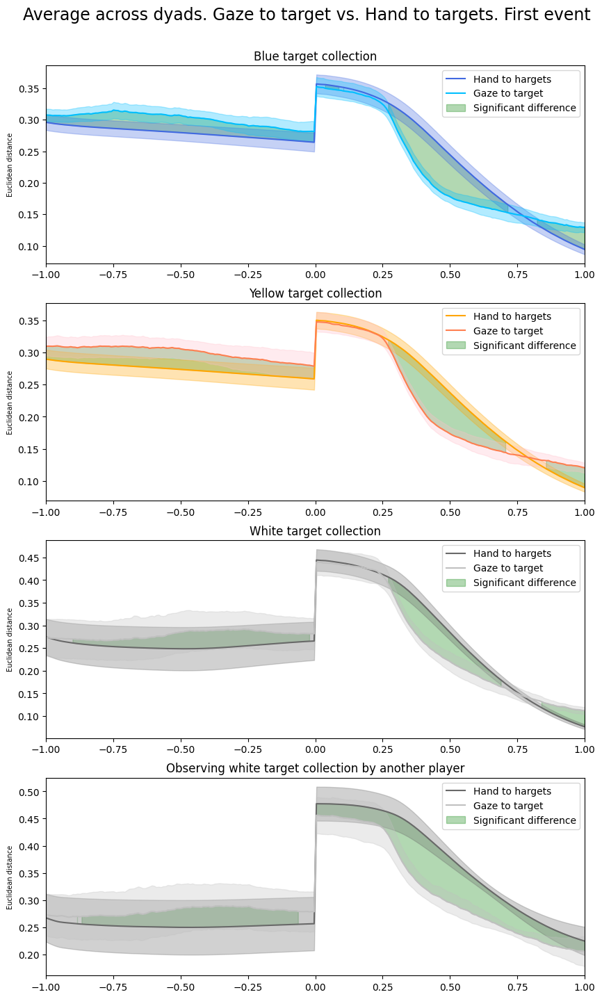

In [179]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
mean_h_bj_0_1_s = []
mean_e_bj_0_1_s = []
mean_h_oj_0_1_s = []
mean_e_oj_0_1_s = []
mean_h_w_0_1_s = []
mean_e_w_0_1_s = []
mean_h_w_0_1_s_observing = []
mean_e_w_0_1_s_observing = []
h_blue_all=[]
e_blue_all = []
h_orange_all=[]
e_orange_all = []
h_white_all=[]
e_white_all = []
h_white_all_observing=[]
e_white_all_observing = []
for game in range(1,15):
    if game==1:
        dyad='[100, 101]'
    elif game==2:
        dyad='[102, 103]'
    elif game==3:
        dyad='[104, 105]'
    elif game==4:
        dyad='[200, 201]'
    elif game==5:
        dyad='[202, 203]'
    elif game==6:
        dyad='[204, 205]'
    elif game==7:
        dyad='[206, 207]'
    elif game==8:
        dyad='[208, 209]'
    elif game==9:
        print('Dyad is excluded')
    elif game==10:
        dyad='[300, 301]'
    elif game==11:
        dyad='[304, 305]'
    elif game==12:
        dyad='[306, 307]'
    elif game==13:
        dyad='[308, 309]'
    elif game==14:
        dyad='[310, 311]'
    else:
        print('Choose dyad from 1 to 14')
    if len(records[dyad].keys())==3:  
        d1_b1=[records[dyad][1], records[dyad][2], records[dyad][3]]
        d1_b1=pd.concat(d1_b1)
    elif len(records[dyad].keys())==2:
        d1_b1=[records[dyad][1], records[dyad][2]]
        d1_b1=pd.concat(d1_b1)
    
    d1_b1_d_h_w_0=((d1_b1['p0_agent_x'] - d1_b1['comp_x'])**2+(d1_b1['p0_agent_y'] - d1_b1['comp_y'])**2)**(1/2)#hand/cursor to targets
    d1_b1_d_h_oj_0=((d1_b1['p0_agent_x'] - d1_b1['coop1_x'])**2+(d1_b1['p0_agent_y'] - d1_b1['coop1_y'])**2)**(1/2)
    d1_b1_d_h_bj_0=((d1_b1['p0_agent_x'] - d1_b1['coop0_x'])**2+(d1_b1['p0_agent_y'] - d1_b1['coop0_y'])**2)**(1/2)
    d1_b1_d_e_w_0=((d1_b1['p0_gaze_x'] - d1_b1['comp_x'])**2+(d1_b1['p0_gaze_y'] - d1_b1['comp_y'])**2)**(1/2)#eye to targets
    d1_b1_d_e_oj_0=((d1_b1['p0_gaze_x'] - d1_b1['coop1_x'])**2+(d1_b1['p0_gaze_y'] - d1_b1['coop1_y'])**2)**(1/2)
    d1_b1_d_e_bj_0=((d1_b1['p0_gaze_x'] - d1_b1['coop0_x'])**2+(d1_b1['p0_gaze_y'] - d1_b1['coop0_y'])**2)**(1/2)

    d1_b1_d_h_w=((d1_b1['p1_agent_x'] - d1_b1['comp_x'])**2+(d1_b1['p1_agent_y'] - d1_b1['comp_y'])**2)**(1/2)#hand/cursor to targets
    d1_b1_d_h_oj=((d1_b1['p1_agent_x'] - d1_b1['coop1_x'])**2+(d1_b1['p1_agent_y'] - d1_b1['coop1_y'])**2)**(1/2)
    d1_b1_d_h_bj=((d1_b1['p1_agent_x'] - d1_b1['coop0_x'])**2+(d1_b1['p1_agent_y'] - d1_b1['coop0_y'])**2)**(1/2)
    d1_b1_d_e_w=((d1_b1['p1_gaze_x'] - d1_b1['comp_x'])**2+(d1_b1['p1_gaze_y'] - d1_b1['comp_y'])**2)**(1/2)#eye to targets
    d1_b1_d_e_oj=((d1_b1['p1_gaze_x'] - d1_b1['coop1_x'])**2+(d1_b1['p1_gaze_y'] - d1_b1['coop1_y'])**2)**(1/2)
    d1_b1_d_e_bj=((d1_b1['p1_gaze_x'] - d1_b1['coop0_x'])**2+(d1_b1['p1_gaze_y'] - d1_b1['coop0_y'])**2)**(1/2)
    sum_c=d1_b1['comp_collected_by_p0']+d1_b1['comp_collected_by_p1'] + d1_b1['coop0_collected']+d1_b1['coop1_collected']  
    trial_end=list(np.where(sum_c>0)[0])
    trials_number=len(trial_end)
    white_p0=list(np.where(d1_b1['comp_collected_by_p0']>0)[0])
    white_p1=list(np.where(d1_b1['comp_collected_by_p1']>0)[0])
    blue_joint=list(np.where(d1_b1['coop0_collected']>0)[0])
    yellow_joint=list(np.where(d1_b1['coop1_collected']>0)[0])
    for trial_id in range(trials_number-1):
        #blue
        if trial_end[trial_id+1] in blue_joint and d1_b1_d_h_bj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
            mean_h_bj_0_1_s.append(d1_b1_d_h_bj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
        if trial_end[trial_id+1] in blue_joint and d1_b1_d_h_bj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
            mean_h_bj_0_1_s.append(d1_b1_d_h_bj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
        if trial_end[trial_id+1] in blue_joint and d1_b1_d_e_bj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
            mean_e_bj_0_1_s.append(d1_b1_d_e_bj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
        if trial_end[trial_id+1] in blue_joint and d1_b1_d_e_bj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
            mean_e_bj_0_1_s.append(d1_b1_d_e_bj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
    #yellow
        if trial_end[trial_id+1] in yellow_joint and d1_b1_d_h_oj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
            mean_h_oj_0_1_s.append(d1_b1_d_h_oj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
        if trial_end[trial_id+1] in yellow_joint and d1_b1_d_h_oj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
            mean_h_oj_0_1_s.append(d1_b1_d_h_oj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
        if trial_end[trial_id+1] in yellow_joint and d1_b1_d_e_oj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
            mean_e_oj_0_1_s.append(d1_b1_d_e_oj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
        if trial_end[trial_id+1] in yellow_joint and d1_b1_d_e_oj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
            mean_e_oj_0_1_s.append(d1_b1_d_e_oj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
    #white
        if trial_end[trial_id+1] in white_p0 and d1_b1_d_h_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
            mean_h_w_0_1_s.append(d1_b1_d_h_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
        if trial_end[trial_id+1] in white_p1 and d1_b1_d_h_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
            mean_h_w_0_1_s.append(d1_b1_d_h_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
        if trial_end[trial_id+1] in white_p0 and d1_b1_d_e_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
            mean_e_w_0_1_s.append(d1_b1_d_e_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
        if trial_end[trial_id+1] in white_p1 and d1_b1_d_e_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
            mean_e_w_0_1_s.append(d1_b1_d_e_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
    #white
        if trial_end[trial_id+1] in white_p0 and d1_b1_d_h_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
            mean_h_w_0_1_s_observing.append(d1_b1_d_h_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
        if trial_end[trial_id+1] in white_p1 and d1_b1_d_h_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
            mean_h_w_0_1_s_observing.append(d1_b1_d_h_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
        if trial_end[trial_id+1] in white_p0 and d1_b1_d_e_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
            mean_e_w_0_1_s_observing.append(d1_b1_d_e_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
        if trial_end[trial_id+1] in white_p1 and d1_b1_d_e_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
            mean_e_w_0_1_s_observing.append(d1_b1_d_e_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
            
    h_blue = np.array(mean_h_bj_0_1_s)
    mean_h_blue = np.nanmean(h_blue, axis=0)
    h_blue_all.append(mean_h_blue)
    
    e_blue = np.array(mean_e_bj_0_1_s)
    mean_e_blue = np.nanmean(e_blue, axis=0)
    e_blue_all.append(mean_e_blue)
    
    h_orange = np.array(mean_h_oj_0_1_s)
    mean_h_orange = np.nanmean(h_orange, axis=0)
    h_orange_all.append(mean_h_orange)
    
    e_orange = np.array(mean_e_oj_0_1_s)
    mean_e_orange = np.nanmean(e_orange, axis=0)
    e_orange_all.append(mean_e_orange)
    
    h_white = np.array(mean_h_w_0_1_s)
    mean_h_white = np.nanmean(h_white, axis=0)
    h_white_all.append(mean_h_white)
    
    e_white = np.array(mean_e_w_0_1_s)
    mean_e_white = np.nanmean(e_white, axis=0)
    e_white_all.append(mean_e_white)
    
    h_white_observing = np.array(mean_h_w_0_1_s_observing)
    mean_h_white_observing = np.nanmean(h_white_observing, axis=0)
    h_white_all_observing.append(mean_h_white_observing)
    
    e_white_observing = np.array(mean_e_w_0_1_s_observing)
    mean_e_white_observing = np.nanmean(e_white_observing, axis=0)
    e_white_all_observing.append(mean_e_white_observing)
    
    
   # e_blue_all.append(mean_e_blue)
h_blue_all=np.array(h_blue_all) 
mean_h_blue_all = np.nanmean(h_blue_all, axis=0)
h_blue_std=np.nanstd(h_blue_all, axis=0)

e_blue_all=np.array(e_blue_all)
mean_e_blue_all = np.nanmean(e_blue_all, axis=0)
e_blue_std=np.nanstd(e_blue_all, axis=0)

h_orange_all=np.array(h_orange_all) 
mean_h_orange_all = np.nanmean(h_orange_all, axis=0)
h_orange_std=np.nanstd(h_orange_all, axis=0)

e_orange_all=np.array(e_orange_all)
mean_e_orange_all = np.nanmean(e_orange_all, axis=0)
e_orange_std=np.nanstd(e_orange_all, axis=0)

h_white_all=np.array(h_white_all) 
mean_h_white_all = np.nanmean(h_white_all, axis=0)
h_white_std=np.nanstd(h_white_all, axis=0)

e_white_all=np.array(e_white_all)
mean_e_white_all = np.nanmean(e_white_all, axis=0)
e_white_std=np.nanstd(e_white_all, axis=0)

h_white_all_observing=np.array(h_white_all_observing) 
mean_h_white_all_observing = np.nanmean(h_white_all_observing, axis=0)
h_white_std_observing=np.nanstd(h_white_all_observing, axis=0)

e_white_all_observing=np.array(e_white_all_observing)
mean_e_white_all_observing = np.nanmean(e_white_all_observing, axis=0)
e_white_std_observing=np.nanstd(e_white_all_observing, axis=0)

alpha = 0.05/240
significant_points = p_values < alpha



plt.figure(figsize=(10, 17))
plt.suptitle(f'Average across dyads. Gaze to target vs. Hand to targets. First event',y=0.93,fontsize=17)

plt.subplot(4,1,1)
# Mean curves
plt.plot(np.linspace(-1, 1, 2*offset), mean_h_blue_all, color='royalblue', label='Mean Hand')
plt.plot(np.linspace(-1, 1, 2*offset), mean_e_blue_all, label='Mean Gaze', color='deepskyblue')
p_values_blue = np.array([stats.ttest_rel(h_blue_all[:, i], e_blue_all[:, i]).pvalue for i in range(2*offset)])
significant_points_blue = p_values_blue < alpha
plt.fill_between(np.linspace(-1, 1, 2*offset), mean_h_blue_all, mean_e_blue_all, where=significant_points_blue, color='green', alpha=0.3, label='Significant Difference')

# Shaded SE bands
plt.fill_between(np.linspace(-1, 1, 2*offset), mean_h_blue_all-h_blue_std, mean_h_blue_all+h_blue_std, color='royalblue', alpha=0.3)
plt.fill_between(np.linspace(-1, 1, 2*offset), mean_e_blue_all-e_blue_std, mean_e_blue_all+e_blue_std, color='deepskyblue', alpha=0.3)
# Shaded area for significant differences
plt.title(f'Blue target collection')
plt.ylabel('Euclidean distance',fontsize=7)
plt.xlim(-1,1)
#plt.legend(['Hand to targets', 'Gaze to targets','Significant difference'])
plt.legend(['Hand to hargets', 'Gaze to target','Significant difference'])

plt.subplot(4,1,2)
# Mean curves
plt.plot(np.linspace(-1, 1, 2*offset), mean_h_orange_all, label='Mean Hand', color='orange')
plt.plot(np.linspace(-1, 1, 2*offset), mean_e_orange_all, label='Mean Gaze', color='coral')
# Shaded area for significant differences
p_values_orange = np.array([stats.ttest_rel(h_orange_all[:, i], e_orange_all[:, i]).pvalue for i in range(2*offset)])
significant_points_orange = p_values_orange < alpha
plt.fill_between(np.linspace(-1, 1, 2*offset), mean_h_orange_all, mean_e_orange_all, where=significant_points_orange, color='green', alpha=0.3, label='Significant Difference')
# Shaded SE bands
plt.fill_between(np.linspace(-1, 1, 2*offset), mean_h_orange_all-h_orange_std, mean_h_orange_all+h_orange_std, color='orange', alpha=0.3)
plt.fill_between(np.linspace(-1, 1, 2*offset), mean_e_orange_all-e_orange_std, mean_e_orange_all+e_orange_std, color='pink', alpha=0.3)

plt.title(f'Yellow target collection')
plt.ylabel('Euclidean distance',fontsize=7)
plt.xlim(-1,1)
plt.legend(['Hand to hargets', 'Gaze to target','Significant difference'])

plt.subplot(4,1,3)
# Mean curves
plt.plot(np.linspace(-1, 1, 2*offset), mean_h_white_all, label='Mean Hand', color='dimgrey')
plt.plot(np.linspace(-1, 1, 2*offset), mean_e_white_all, label='Mean Gaze', color='silver')
p_values_white = np.array([stats.ttest_rel(h_white_all[:, i], e_white_all[:, i]).pvalue for i in range(2*offset)])
significant_points_white = p_values_white < alpha
plt.fill_between(np.linspace(-1, 1, 2*offset), mean_h_white_all, mean_e_white_all, where=significant_points_white, color='green', alpha=0.3, label='Significant Difference')

# Shaded SE bands
plt.fill_between(np.linspace(-1, 1, 2*offset), mean_h_white_all-h_white_std, mean_h_white_all+h_white_std, color='dimgrey', alpha=0.3)
plt.fill_between(np.linspace(-1, 1, 2*offset), mean_e_white_all-e_white_std, mean_e_white_all+e_white_std, color='silver', alpha=0.3)
# Shaded area for significant differences
plt.title(f'White target collection')
plt.ylabel('Euclidean distance',fontsize=7)
plt.xlim(-1,1)
plt.legend(['Hand to hargets', 'Gaze to target','Significant difference'])

plt.subplot(4,1,4)
# Mean curves
plt.plot(np.linspace(-1, 1, 2*offset), mean_h_white_all_observing, label='Mean Hand', color='dimgrey')
plt.plot(np.linspace(-1, 1, 2*offset), mean_e_white_all_observing, label='Mean Gaze', color='silver')
p_values_white_o = np.array([stats.ttest_rel(h_white_all_observing[:, i], e_white_all_observing[:, i]).pvalue for i in range(2*offset)])
significant_points_white_o = p_values_white_o < alpha
plt.fill_between(np.linspace(-1, 1, 2*offset), mean_h_white_all_observing, mean_e_white_all_observing, where=significant_points_white_o, color='green', alpha=0.3, label='Significant Difference')

# Shaded SE bands
plt.fill_between(np.linspace(-1, 1, 2*offset), mean_h_white_all_observing-h_white_std_observing, mean_h_white_all_observing+h_white_std_observing, color='dimgrey', alpha=0.3)
plt.fill_between(np.linspace(-1, 1, 2*offset), mean_e_white_all_observing-e_white_std_observing, mean_e_white_all_observing+e_white_std_observing, color='silver', alpha=0.3)
# Shaded area for significant differences
plt.title(f'Observing white target collection by another player')
plt.ylabel('Euclidean distance',fontsize=7)
plt.xlim(-1,1)
plt.legend(['Hand to hargets', 'Gaze to target','Significant difference'])

#blue=blue/len(blue_joint)

#plt.subplot(4,2,2)

#plt.plot(np.linspace(-1,25,1000), blue,'-',c='red' )
#plt.subplot(4,2,2)
#plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]] - frames[trial_end[trial_id]-offset] - 1, blue,'-','r' )
#plt.suptitle(f'Dyad ID {dyad}, block {block}. Average across trials', fontsize=14)


[[0.50929708 0.51457097 0.51879081 ... 0.3508407  0.34384991 0.33685495]
 [0.04850063 0.04763639 0.04653646 ... 0.04308181 0.04308181 0.04203881]
 [0.21826172 0.22166268 0.22864616 ... 0.04102277 0.0416874  0.0416874 ]
 ...
 [0.24660544 0.24660544 0.24850386 ... 0.01764515 0.01764515 0.01764515]
 [0.30990038 0.310367   0.31037722 ... 0.05773003 0.05773003 0.05773003]
 [0.32011074 0.32208933 0.32208933 ... 0.03394431 0.03394431 0.03394431]]


<class 'numpy.ndarray'>
2


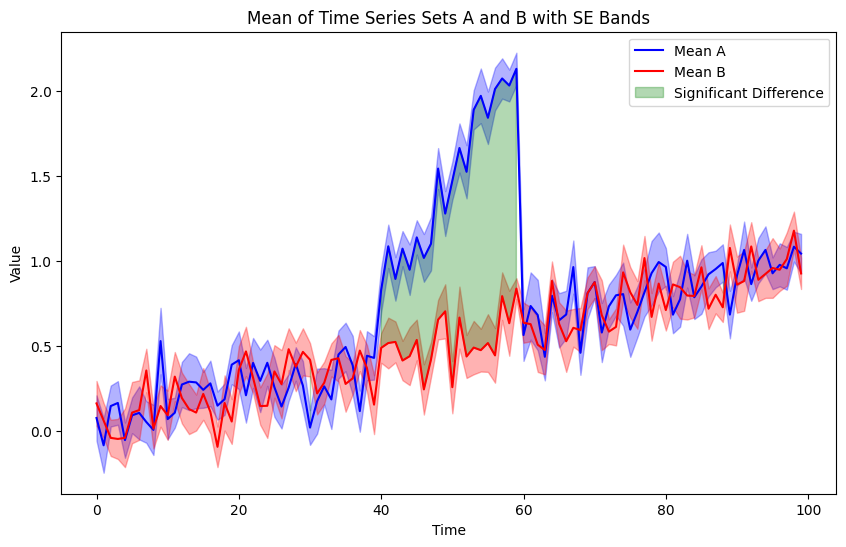

In [72]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats

# Seed for reproducibility
np.random.seed(42)

# Parameters
n_series = 13
n_points = 100

# Generate synthetic time series data
# Set A with a bit more variance than B
time_series_A = np.random.normal(loc=0, scale=0.5, size=(n_series, n_points)) + np.linspace(0, 1, n_points)
time_series_B = np.random.normal(loc=0, scale=0.5, size=(n_series, n_points)) + np.linspace(0, 1, n_points)
print(type(time_series_A))
print(len(time_series_A.shape))
# Adjust synthetic data generation for difference between A and B in the range 40-60 time points
time_series_A[:, 40:60] += np.linspace(0.5, 1.5, 20)

# Calculate mean and SE for both sets
mean_A = np.mean(time_series_A, axis=0)
se_A = stats.sem(time_series_A, axis=0)
mean_B = np.mean(time_series_B, axis=0)
se_B = stats.sem(time_series_B, axis=0)

# Perform a paired t-test for each time point
p_values = np.array([stats.ttest_rel(time_series_A[:, i], time_series_B[:, i]).pvalue for i in range(n_points)])

# Adjust p-values for multiple comparisons (optional)
# p_values = stats.false_discovery_control(p_values)


# Significance level
alpha = 0.05

# Identify significant time points
significant_points = p_values < alpha


# Plotting
plt.figure(figsize=(10, 6))
time = np.arange(n_points)

# Mean curves
plt.plot(time, mean_A, label='Mean A', color='blue')
plt.plot(time, mean_B, label='Mean B', color='red')

# Shaded SE bands
plt.fill_between(time, mean_A-se_A, mean_A+se_A, color='blue', alpha=0.3)
plt.fill_between(time, mean_B-se_B, mean_B+se_B, color='red', alpha=0.3)

# Shaded area for significant differences
plt.fill_between(time, mean_A, mean_B, where=significant_points, color='green', alpha=0.3, label='Significant Difference')


plt.title('Mean of Time Series Sets A and B with SE Bands')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.show()

734
707
717
700


ValueError: x and y must have same first dimension, but have shapes (135,) and (240,)

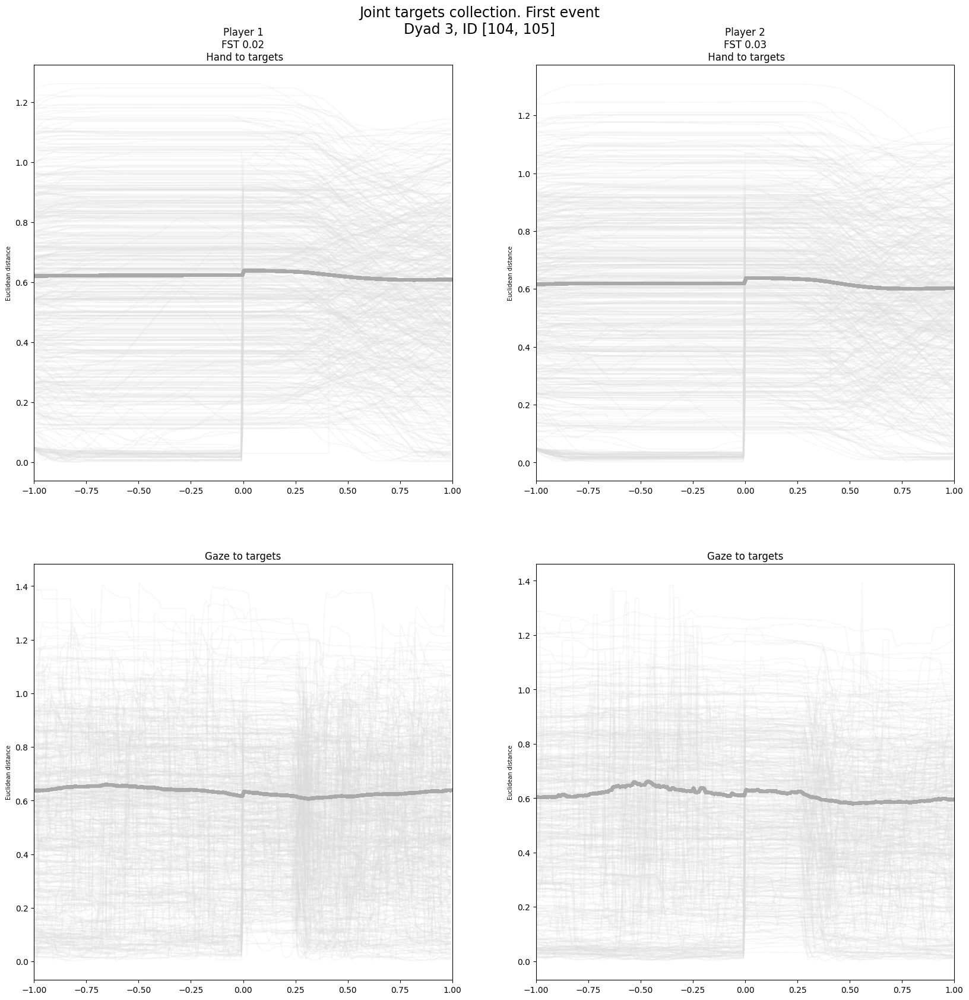

In [34]:
l=0
y=0
#blue= np.zeros(1000)
mean_h_bj_0_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in blue_joint and d1_b1_d_h_bj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
            mean_h_bj_0_s.append(d1_b1_d_h_bj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
    
h_bj_0_s = np.array(mean_h_bj_0_s)
mean_h_bj_0_s = np.nanmean(h_bj_0_s, axis=0)
median_h_bj_0_s = np.nanmedian(h_bj_0_s, axis=0)

mean_h_bj_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in blue_joint and d1_b1_d_h_bj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_h_bj_s.append(d1_b1_d_h_bj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
h_bj_s = np.array(mean_h_bj_s)
mean_h_bj_s = np.nanmean(h_bj_s, axis=0)
median_h_bj_s = np.nanmedian(h_bj_s, axis=0)

mean_e_bj_0_s = []
for trial_id in range(trials_number-1):
    
    if trial_end[trial_id+1] in blue_joint and d1_b1_d_e_bj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        l=l+1
        mean_e_bj_0_s.append(d1_b1_d_e_bj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
bj_0_s = np.array(mean_e_bj_0_s)
mean_e_bj_0_s = np.nanmean(mean_e_bj_0_s, axis=0)
median_e_bj_0_s = np.nanmedian(bj_0_s, axis=0)

print(len(blue_joint))
print(l)
mean_e_bj_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in blue_joint and d1_b1_d_e_bj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_e_bj_s.append(d1_b1_d_e_bj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
e_bj_s = np.array(mean_e_bj_s)
mean_e_bj_s = np.nanmean(e_bj_s, axis=0)
median_e_bj_s = np.nanmedian(e_bj_s, axis=0)
#yellow
mean_h_oj_0_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in yellow_joint and d1_b1_d_h_oj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_h_oj_0_s.append(d1_b1_d_h_oj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
h_oj_0_s = np.array(mean_h_oj_0_s)
mean_h_oj_0_s = np.nanmean(h_oj_0_s, axis=0)
median_h_oj_0_s = np.nanmedian(h_oj_0_s, axis=0)

mean_h_oj_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in yellow_joint and d1_b1_d_h_oj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_h_oj_s.append(d1_b1_d_h_oj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
h_oj_s = np.array(mean_h_oj_s)
mean_h_oj_s = np.nanmean(h_oj_s, axis=0)
median_h_oj_s = np.nanmedian(h_oj_s, axis=0)

mean_e_oj_0_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in yellow_joint and d1_b1_d_e_oj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        y=y+1
        mean_e_oj_0_s.append(d1_b1_d_e_oj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
e_oj_0_s = np.array(mean_e_oj_0_s)
mean_e_oj_0_s = np.nanmean(e_oj_0_s, axis=0)
median_e_oj_0_s = np.nanmedian(e_oj_0_s, axis=0)
print(len(yellow_joint))
print(y)
mean_e_oj_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in yellow_joint and d1_b1_d_e_oj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_e_oj_s.append(d1_b1_d_e_oj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
e_oj_s = np.array(mean_e_oj_s)
mean_e_oj_s = np.nanmean(e_oj_s, axis=0)
median_e_oj_s = np.nanmedian(e_oj_s, axis=0)

#white
mean_h_w_0_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in yellow_joint or blue_joint and d1_b1_d_h_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_h_w_0_s.append(d1_b1_d_h_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
h_w_0_s = np.array(mean_h_w_0_s)
mean_h_w_0_s = np.nanmean(h_w_0_s, axis=0)
median_h_w_0_s = np.nanmedian(h_w_0_s, axis=0)

mean_h_w_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in yellow_joint or blue_joint and d1_b1_d_h_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_h_w_s.append(d1_b1_d_h_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
h_w_s = np.array(mean_h_w_s)
mean_h_w_s = np.nanmean(h_w_s, axis=0)
median_h_w_s = np.nanmedian(h_w_s, axis=0)


mean_e_w_0_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in yellow_joint or blue_joint and d1_b1_d_e_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_e_w_0_s.append(d1_b1_d_e_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
e_w_0_s = np.array(mean_e_w_0_s)
mean_e_w_0_s = np.nanmean(e_w_0_s, axis=0)
median_e_w_0_s = np.nanmedian(e_w_0_s, axis=0)



mean_e_w_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in yellow_joint or blue_joint and d1_b1_d_e_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_e_w_s.append(d1_b1_d_e_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
e_w_s = np.array(mean_e_w_s)
mean_e_w_s = np.nanmean(e_w_s, axis=0)
median_e_w_s = np.nanmedian(e_w_s, axis=0)
#
mean_h_w_0_p1_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in yellow_joint or blue_joint and d1_b1_d_h_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_h_w_0_p1_s.append(d1_b1_d_h_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
h_w_0_p1_s = np.array(mean_h_w_0_p1_s)
mean_h_w_0_p1_s = np.nanmean(h_w_0_p1_s, axis=0)
median_h_w_0_p1_s = np.nanmedian(h_w_0_p1_s, axis=0)
mean_h_w_p1_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in yellow_joint or blue_joint and d1_b1_d_h_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_h_w_p1_s.append(d1_b1_d_h_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
h_w_p1_s = np.array(mean_h_w_p1_s)
mean_h_w_p1_s= np.nanmean(h_w_p1_s, axis=0)
median_h_w_p1_s= np.nanmedian(h_w_p1_s, axis=0)


mean_e_w_0_p1_s= []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in yellow_joint or blue_joint and d1_b1_d_e_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_e_w_0_p1_s.append(d1_b1_d_e_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
e_w_0_p1_s = np.array(mean_e_w_0_p1_s)
mean_e_w_0_p1_s = np.nanmean(e_w_0_p1_s, axis=0)
median_e_w_0_p1_s = np.nanmedian(e_w_0_p1_s, axis=0)

mean_e_w_p1_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in yellow_joint or blue_joint and d1_b1_d_e_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_e_w_p1_s.append(d1_b1_d_e_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
e_w_p1_s = np.array(mean_e_w_p1_s)
mean_e_w_p1_s = np.nanmean(e_w_p1_s, axis=0)
median_e_w_p1_s = np.nanmedian(e_w_p1_s, axis=0)




plt.figure(figsize=(20, 20))
plt.suptitle(f'Joint targets collection. First event\nDyad {game}, ID {dyad}',y=0.93,fontsize=17)
#plt.title(f'Dyad ID {dyad}, block {block}. Average across trials')
for trial_id in range(trials_number):
    if trial_end[trial_id+1] in yellow_joint or blue_joint:
        
        plt.subplot(2,2,1)
        plt.plot(np.linspace(-1, 1, 2*offset), mean_h_w_0_s,c='darkgrey',linewidth=4.0)
        #plt.plot(np.linspace(-1, 1, 2*offset), median_h_w_0_s,c='pink',linewidth=4.0)
        plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_h_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset],'-',c='gainsboro',alpha=0.2)
        plt.xlim(-1,1)
        plt.title(f'Player 1\nFST {FST_player1}\n Hand to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        #plt.xlabel('Frames in seconds',fontsize=7)
        
        plt.subplot(2,2,2)
        plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_h_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset],'-',c='gainsboro',alpha=0.2)
        plt.plot(np.linspace(-1, 1, 2*offset), mean_h_w_s,c='darkgrey',linewidth=4.0)
        #plt.plot(np.linspace(-1, 1, 2*offset), median_h_w_s,c='pink',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Player 2\nFST {FST_player2}\n Hand to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        #plt.xlabel('Frames in seconds',fontsize=7)
        
        plt.subplot(2,2,3)
        if d1_b1_d_e_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
            plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_e_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset],'-',c='gainsboro',alpha=0.2)
        plt.plot(np.linspace(-1, 1, 2*offset), mean_e_w_0_s,c='darkgrey',linewidth=4.0)
        #plt.plot(np.linspace(-1, 1, 2*offset), median_e_w_0_s,c='pink',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Gaze to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        #plt.xlabel('Frames in seconds',fontsize=7)
        #plt.ylim(0.00,1.41)
        
        plt.subplot(2,2,4)
        if d1_b1_d_e_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
            plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_e_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset],'-',c='gainsboro',alpha=0.2)
        plt.plot(np.linspace(-1, 1, 2*offset), mean_e_w_s,c='darkgrey',linewidth=4.0)
        #plt.plot(np.linspace(-1, 1, 2*offset), median_e_w_s,c='pink',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Gaze to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        #plt.xlabel('Frames in seconds',fontsize=7)
        #plt.ylim(0.00,1.41)

#blue=blue/len(blue_joint)

#plt.subplot(4,2,2)

#plt.plot(np.linspace(-1,25,1000), blue,'-',c='red' )
#plt.subplot(4,2,2)
#plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]] - frames[trial_end[trial_id]-offset] - 1, blue,'-','r' )
#plt.suptitle(f'Dyad ID {dyad}, block {block}. Average across trials', fontsize=14)


0
1843
0
1835


ValueError: x and y must have same first dimension, but have shapes (121,) and (240,)

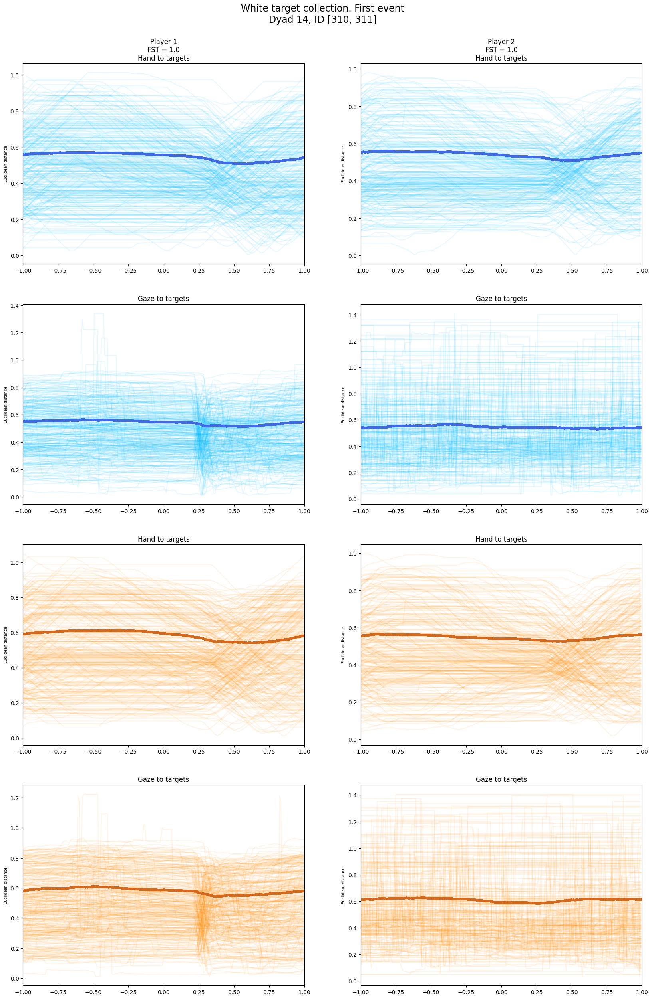

In [27]:
l=0
y=0
#blue= np.zeros(1000)
mean_h_bj_0_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in white_p0 or white_p1 and d1_b1_d_h_bj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
            mean_h_bj_0_s.append(d1_b1_d_h_bj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
    
h_bj_0_s = np.array(mean_h_bj_0_s)
mean_h_bj_0_s = np.nanmean(h_bj_0_s, axis=0)
median_h_bj_0_s = np.nanmedian(h_bj_0_s, axis=0)

mean_h_bj_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in white_p0 or white_p1 and d1_b1_d_h_bj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_h_bj_s.append(d1_b1_d_h_bj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
h_bj_s = np.array(mean_h_bj_s)
mean_h_bj_s = np.nanmean(h_bj_s, axis=0)
median_h_bj_s = np.nanmedian(h_bj_s, axis=0)

mean_e_bj_0_s = []
for trial_id in range(trials_number-1):
    
    if trial_end[trial_id+1] in white_p0 or white_p1 and d1_b1_d_e_bj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        l=l+1
        mean_e_bj_0_s.append(d1_b1_d_e_bj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
bj_0_s = np.array(mean_e_bj_0_s)
mean_e_bj_0_s = np.nanmean(mean_e_bj_0_s, axis=0)
median_e_bj_0_s = np.nanmedian(bj_0_s, axis=0)

print(len(blue_joint))
print(l)
mean_e_bj_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in white_p0 or white_p1 and d1_b1_d_e_bj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_e_bj_s.append(d1_b1_d_e_bj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
e_bj_s = np.array(mean_e_bj_s)
mean_e_bj_s = np.nanmean(e_bj_s, axis=0)
median_e_bj_s = np.nanmedian(e_bj_s, axis=0)
#yellow
mean_h_oj_0_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in white_p0 or white_p1 and d1_b1_d_h_oj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_h_oj_0_s.append(d1_b1_d_h_oj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
h_oj_0_s = np.array(mean_h_oj_0_s)
mean_h_oj_0_s = np.nanmean(h_oj_0_s, axis=0)
median_h_oj_0_s = np.nanmedian(h_oj_0_s, axis=0)

mean_h_oj_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in white_p0 or white_p1 and d1_b1_d_h_oj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_h_oj_s.append(d1_b1_d_h_oj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
h_oj_s = np.array(mean_h_oj_s)
mean_h_oj_s = np.nanmean(h_oj_s, axis=0)
median_h_oj_s = np.nanmedian(h_oj_s, axis=0)

mean_e_oj_0_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in white_p0 or white_p1 and d1_b1_d_e_oj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        y=y+1
        mean_e_oj_0_s.append(d1_b1_d_e_oj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
e_oj_0_s = np.array(mean_e_oj_0_s)
mean_e_oj_0_s = np.nanmean(e_oj_0_s, axis=0)
median_e_oj_0_s = np.nanmedian(e_oj_0_s, axis=0)
print(len(yellow_joint))
print(y)
mean_e_oj_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in white_p0 or white_p1 and d1_b1_d_e_oj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_e_oj_s.append(d1_b1_d_e_oj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
e_oj_s = np.array(mean_e_oj_s)
mean_e_oj_s = np.nanmean(e_oj_s, axis=0)
median_e_oj_s = np.nanmedian(e_oj_s, axis=0)

#white
mean_h_w_0_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in white_p0 and d1_b1_d_h_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_h_w_0_s.append(d1_b1_d_h_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
h_w_0_s = np.array(mean_h_w_0_s)
mean_h_w_0_s = np.nanmean(h_w_0_s, axis=0)
median_h_w_0_s = np.nanmedian(h_w_0_s, axis=0)

mean_h_w_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in white_p0 and d1_b1_d_h_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_h_w_s.append(d1_b1_d_h_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
h_w_s = np.array(mean_h_w_s)
mean_h_w_s = np.nanmean(h_w_s, axis=0)
median_h_w_s = np.nanmedian(h_w_s, axis=0)


mean_e_w_0_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in white_p0 and d1_b1_d_e_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_e_w_0_s.append(d1_b1_d_e_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
e_w_0_s = np.array(mean_e_w_0_s)
mean_e_w_0_s = np.nanmean(e_w_0_s, axis=0)
median_e_w_0_s = np.nanmedian(e_w_0_s, axis=0)



mean_e_w_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in white_p0 and d1_b1_d_e_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_e_w_s.append(d1_b1_d_e_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
e_w_s = np.array(mean_e_w_s)
mean_e_w_s = np.nanmean(e_w_s, axis=0)
median_e_w_s = np.nanmedian(e_w_s, axis=0)
#
mean_h_w_0_p1_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in white_p1 and d1_b1_d_h_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_h_w_0_p1_s.append(d1_b1_d_h_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
h_w_0_p1_s = np.array(mean_h_w_0_p1_s)
mean_h_w_0_p1_s = np.nanmean(h_w_0_p1_s, axis=0)
median_h_w_0_p1_s = np.nanmedian(h_w_0_p1_s, axis=0)
mean_h_w_p1_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in white_p1 and d1_b1_d_h_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_h_w_p1_s.append(d1_b1_d_h_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
h_w_p1_s = np.array(mean_h_w_p1_s)
mean_h_w_p1_s= np.nanmean(h_w_p1_s, axis=0)
median_h_w_p1_s= np.nanmedian(h_w_p1_s, axis=0)


mean_e_w_0_p1_s= []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in white_p1 and d1_b1_d_e_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_e_w_0_p1_s.append(d1_b1_d_e_w_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
e_w_0_p1_s = np.array(mean_e_w_0_p1_s)
mean_e_w_0_p1_s = np.nanmean(e_w_0_p1_s, axis=0)
median_e_w_0_p1_s = np.nanmedian(e_w_0_p1_s, axis=0)

mean_e_w_p1_s = []
for trial_id in range(trials_number-1):
    if trial_end[trial_id+1] in white_p1 and d1_b1_d_e_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
        mean_e_w_p1_s.append(d1_b1_d_e_w.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset])
e_w_p1_s = np.array(mean_e_w_p1_s)
mean_e_w_p1_s = np.nanmean(e_w_p1_s, axis=0)
median_e_w_p1_s = np.nanmedian(e_w_p1_s, axis=0)




plt.figure(figsize=(20, 30))
plt.suptitle(f'White target collection. First event\nDyad {game}, ID {dyad}',y=0.93,fontsize=17)
#plt.title(f'Dyad ID {dyad}, block {block}. Average across trials')
for trial_id in range(trials_number):
    if trial_end[trial_id+1] in white_p0:
        plt.subplot(4,2,1)
        plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_h_bj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset],'-',c='deepskyblue',alpha=0.1)
        #plt.plot(np.linspace(-1, 1, 2*offset), mean_h_bj_0_s,c='royalblue',linewidth=4.0)
        plt.plot(np.linspace(-1, 1, 2*offset), median_h_bj_0_s,c='royalblue',linewidth=4.0)
        plt.xlim(-1,1)
        #b = np.array(d1_b1_d_h_bj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]])
# Pad array 'a' with zeros to match the shape of array 'b' 
        #b_padded = np.pad(b, (0, blue.shape[0] - b.shape[0]), mode='constant')
        #blue=b_padded+blue
        plt.title(f'Player 1\nFST = {FST_player1}\nHand to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        #plt.xlabel('Frames in seconds',fontsize=7)
# Perform the sum operation
        #x=(np.nanmean(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]] - frames[trial_end[trial_id]-offset] - 1))
        #y=(np.nanmean(d1_b1_d_h_bj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]])
        #y.append(d1_b1_d_h_bj_0.iloc[blue_joint[trial_id+1]-offset:trial_end[trial_id]]
        #plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]] - frames[trial_end[trial_id]-offset] - 1,y,'-','r')
        plt.subplot(4,2,3)
        if d1_b1_d_e_bj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
            plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_e_bj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset],'-',c='deepskyblue',alpha=0.1)
        #plt.plot(np.linspace(-1, 1, 2*offset), mean_e_bj_0_s,c='royalblue',linewidth=4.0)
        plt.plot(np.linspace(-1, 1, 2*offset), median_e_bj_0_s,c='royalblue',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Gaze to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        
        plt.subplot(4,2,5)
        plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_h_oj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset],'-',c='darkorange',alpha=0.1)
        #plt.plot(np.linspace(-1, 1, 2*offset), mean_h_oj_0_s,c='chocolate',linewidth=4.0)
        plt.plot(np.linspace(-1, 1, 2*offset), median_h_oj_0_s,c='chocolate',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Hand to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        #plt.xlabel('Frames in seconds',fontsize=7)
        
        plt.subplot(4,2,7)
        if d1_b1_d_e_oj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
            plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_e_oj_0.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset],'-',c='darkorange',alpha=0.1)
        #plt.plot(np.linspace(-1, 1, 2*offset), mean_e_oj_0_s,c='chocolate',linewidth=4.0)
        plt.plot(np.linspace(-1, 1, 2*offset), median_e_oj_0_s,c='chocolate',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Gaze to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        #plt.xlabel('Frames in seconds',fontsize=7)
    if trial_end[trial_id+1] in white_p1:
        plt.subplot(4,2,2)
        plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_h_bj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset],'-',c='deepskyblue',alpha=0.1)
        #plt.plot(np.linspace(-1, 1, 2*offset), mean_h_bj_s,c='royalblue',linewidth=4.0)
        plt.plot(np.linspace(-1, 1, 2*offset), median_h_bj_s,c='royalblue',linewidth=4.0)
        plt.title(f'Player 2\nFST = {FST_player2}\nHand to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        #plt.xlabel('Frames in seconds',fontsize=7)
        plt.xlim(-1,1)
        
        plt.subplot(4,2,4)
        if d1_b1_d_e_bj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
            plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_e_bj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset],'-',c='deepskyblue',alpha=0.1)
        #plt.plot(np.linspace(-1, 1, 2*offset), mean_e_bj_s,c='royalblue',linewidth=4.0)
        plt.plot(np.linspace(-1, 1, 2*offset), median_e_bj_s,c='royalblue',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Gaze to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        #plt.ylim(0.00,1.41)
        #plt.xlabel('Frames in seconds',fontsize=7)
        plt.subplot(4,2,6)
        plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_h_oj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset],'-',c='darkorange',alpha=0.1)
        #plt.plot(np.linspace(-1, 1, 2*offset), mean_h_oj_s,c='chocolate',linewidth=4.0)
        plt.plot(np.linspace(-1, 1, 2*offset), median_h_oj_s,c='chocolate',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Hand to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        #plt.xlabel('Frames in seconds',fontsize=7)
        
        plt.subplot(4,2,8)
        if d1_b1_d_e_oj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset].max()<2**(1/2):
            plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset] - frames[trial_end[trial_id]-offset] - 1,d1_b1_d_e_oj.iloc[trial_end[trial_id]-offset:trial_end[trial_id]+offset],'-',c='darkorange',alpha=0.1)
        #plt.plot(np.linspace(-1, 1, 2*offset), mean_e_oj_s,c='chocolate',linewidth=4.0)
        plt.plot(np.linspace(-1, 1, 2*offset), median_e_oj_s,c='chocolate',linewidth=4.0)
        plt.xlim(-1,1)
        plt.title(f'Gaze to targets')
        plt.ylabel('Euclidean distance',fontsize=7)
        #plt.xlabel('Frames in seconds',fontsize=7)
        #plt.ylim(0.00,1.41)
    
        
    
#blue=blue/len(blue_joint)

#plt.subplot(4,2,2)

#plt.plot(np.linspace(-1,25,1000), blue,'-',c='red' )
#plt.subplot(4,2,2)
#plt.plot(frames.iloc[trial_end[trial_id]-offset:trial_end[trial_id]] - frames[trial_end[trial_id]-offset] - 1, blue,'-','r' )
#plt.suptitle(f'Dyad ID {dyad}, block {block}. Average across trials', fontsize=14)
